# Inference for the SDEMEM Ornstein-Uhlenbeck process 

Algorithms:

- PMMH-3000 naive data set 100,200,300,400,500
- PMMH-3000 data set 100,200,300,400,500
- CPMMH-099 N = 100 data set 100,200,300,400,500
- CPMMH-0999 N = 50 data set 100,200,300,400,500

- CPMMH-0999 N = 100 data set 100
- PMMH-100 data set 100

### Setput 

Set correct working directory. 

In [1]:
cd("..") # set correct working directory 
cd("..") 
pwd() # the path should go to the folder with the .git file 

"/home/samuel/Documents/projects/cpmmh for sdemems/code"

Load data and functions 

In [2]:
using Pkg
using Pkg
using PyCall 
PyDict(pyimport("matplotlib")["rcParams"])["ps.useafm"] = [true]
PyDict(pyimport("matplotlib")["rcParams"])["pdf.use14corefonts"] = [true]
PyDict(pyimport("matplotlib")["rcParams"])["text.usetex"] = [true]
using PyPlot 
using LinearAlgebra
using DataFrames
using KernelDensity  
using LaTeXStrings
using Distributions

save_plots = false 
save_data = false 
run_algorithms = true 

# load functions
include(pwd()*"/src/SDEMEM OU process/ou_sdemem.jl")
include(pwd()*"/src/SDEMEM OU process/mcmc.jl")

#M_subjects = parse(Int,ARGS[1])
#N_time = parse(Int,ARGS[2])

N_time = 200
M_subjects = 40
seed = 100
y,x,t_vec,dt,η,σ_ϵ,ϕ,prior_parameters_η,prior_parameters_σ_ϵ = set_up(M=M_subjects,N=N_time, seed = seed)


┌ Warning: `getindex(o::PyObject, s::AbstractString)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o."s"` instead of `o["s"]`.
│   caller = top-level scope at In[2]:4
└ @ Core In[2]:4
┌ Warning: `getindex(o::PyObject, s::AbstractString)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o."s"` instead of `o["s"]`.
│   caller = top-level scope at In[2]:5
└ @ Core In[2]:5
┌ Warning: `getindex(o::PyObject, s::AbstractString)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o."s"` instead of `o["s"]`.
│   caller = top-level scope at In[2]:6
└ @ Core In[2]:6


([-0.197441 0.0445868 … 10.8305 11.4634; -0.408943 0.0123882 … 15.0314 15.1339; … ; -0.1433 0.472403 … 8.17592 7.75262; 0.492375 0.637416 … 10.1097 10.0065], [0.0 0.225013 … 11.173 11.1535; 0.0 0.0400755 … 14.9598 15.2664; … ; 0.0 0.00388002 … 8.07271 8.06666; 0.0 0.182204 … 10.3196 10.4451], [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45  …  9.5, 9.55, 9.6, 9.65, 9.7, 9.75, 9.8, 9.85, 9.9, 9.95], 0.05, [-0.7, 2.3, -0.9, 4.0, 10.0, 4.0], 0.3, [-1.02907 2.42135 -1.20071; -0.805758 2.79924 0.116282; … ; -1.71067 2.4605 -0.206058; -0.740241 2.32989 -1.10144], [0.0 1.0 2.0 1.0; 1.0 1.0 2.0 0.5; 0.0 1.0 2.0 1.0], [1.0, 2.5])

In [3]:
save_plots = false 

false

Plot latant process (left) and observed process (rigth).

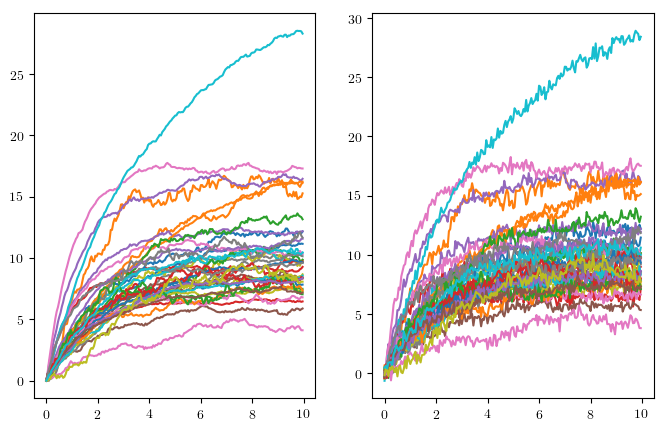

In [4]:
PyPlot.figure(figsize=(8,5))
PyPlot.subplot(121)
PyPlot.plot(t_vec,Array(x')); 
PyPlot.subplot(122)
PyPlot.plot(t_vec,Array(y'));

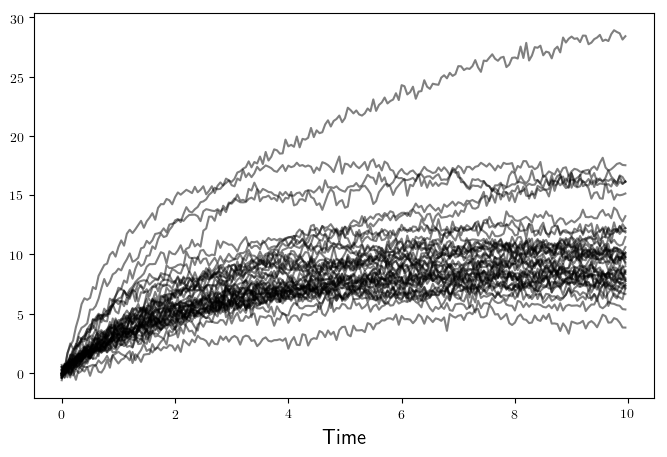

In [5]:
# fig 1 in paper 

PyPlot.figure(figsize=(8,5))
PyPlot.plot(t_vec,Array(y'), "k", alpha = 0.5);
PyPlot.xlabel("Time",fontsize=15)


if save_plots
    PyPlot.savefig("figures/data_ou_sdemem.pdf", format="pdf", dpi=1000)
    run(`pdftops -eps figures/data_ou_sdemem.pdf figures/data_ou_sdemem.eps`)
end 

### Algorithm settings 

In [6]:
R = 60000 # 60000
burn_in = 10000 # 10000

10000

Setting for trace plots.

In [7]:
plot_from_start = true # set to true to plot chains from first iteration
burn_in_trace = 1

if !plot_from_start
    burn_in_trace = burn_in
end

### Run/Load Gibbs sampler with Kalman filter 

In [8]:
job = string(M_subjects)*"_"*string(N_time)

cov_ϕ = [0.04;0.08;0.04]
cov_σ_ϵ = 0.02
startval_ϕ = ones(M_subjects,3)

for j = 1:3

    μ_0_j, M_0_j, α_j, β_j = prior_parameters_η[j,:]

    startval_ϕ[:,j,1] = μ_0_j*ones(M_subjects) 
    
end





# start at far away from true parameter values 

startval_σ_ϵ = 0.01


# start at true parameter values 
#startval_ϕ = ϕ
#startval_σ_ϵ = σ_ϵ

job 

"40_200"

In [9]:
# load stored results
chain_σ_ϵ_kalman = Matrix(CSV.read("data/SDEMEM OU/kalman/chain_sigma_epsilon_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_σ_ϵ_kalman = Matrix(chain_σ_ϵ_kalman')
chain_η_kalman = Matrix(CSV.read("data/SDEMEM OU/kalman/chain_eta_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_η_kalman = Matrix(chain_η_kalman')
chain_ϕ_export = Matrix(CSV.read("data/SDEMEM OU/kalman/chain_phi_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_ϕ_export = Matrix(chain_ϕ_export')
chain_ϕ_kalman = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_kalman[m,j,:] = chain_ϕ_export[idx,:]
    end 
end 

simdata_kalman = Matrix(CSV.read("data/SDEMEM OU/kalman/sim_data_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
println(simdata_kalman[1])
println(simdata_kalman[2])
println(simdata_kalman[3])
println(simdata_kalman[4])

┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330


72.920385229
0.25208041666666664
0.25811666666666666
1.0


In [10]:
println([mean(chain_σ_ϵ_kalman[burn_in:end]) 0 0;
                         mean(chain_ϕ_kalman[:,:,burn_in:end], dims=3)])

[0.299851 0.0 0.0; -1.05945 2.43431 -1.1864; -0.666606 2.77798 0.240631; -0.67643 2.00946 -1.31252; -0.0287574 2.20892 -1.54589; -0.320012 2.78968 -0.871068; -0.768128 2.15218 -1.25885; -0.04733 2.85457 -0.847886; -1.03577 2.3403 -1.04637; -0.812267 2.32199 -0.469721; -0.697127 2.3356 -0.95897; -0.937056 2.51126 -0.868687; -1.34235 2.83838 -0.689863; -1.06974 2.34109 -0.501002; -0.52275 1.88971 -1.63262; -0.325826 2.49693 -1.05259; -0.748087 1.76759 -1.12117; -0.197639 2.37442 -1.0025; -1.40355 2.39156 -1.0588; -0.318119 1.97845 -1.52375; -1.3571 3.41988 -0.975709; -0.556943 2.08823 -1.0783; -1.48597 2.89038 -1.3928; -1.24934 2.64435 -0.394814; -0.943593 2.28385 -0.324349; -0.69788 2.43902 -0.991439; -0.82214 2.13996 -0.858804; -0.287548 1.89655 -0.958821; -0.924171 2.47406 -0.243364; -1.13028 2.20485 -1.31943; -1.04818 2.16359 -1.41679; -1.13296 2.30899 -1.35415; -0.900441 2.02443 -0.775892; -0.3877 2.03714 -0.125603; -0.654698 2.13945 -0.632865; -0.873012 2.1332 -1.52593; -0.710678 2

Chain for $\sigma_{\epsilon}$. Blue line trace, black dashed line true parameter value.

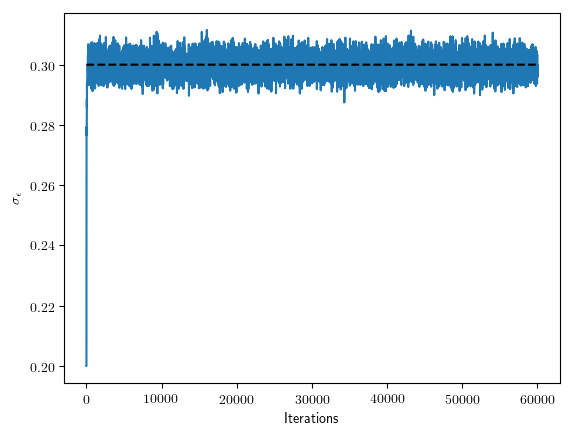

In [11]:
PyPlot.figure()
PyPlot.plot(chain_σ_ϵ_kalman[1,burn_in_trace:end])
PyPlot.plot(σ_ϵ*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\sigma_{\epsilon}")
PyPlot.xlabel("Iterations");

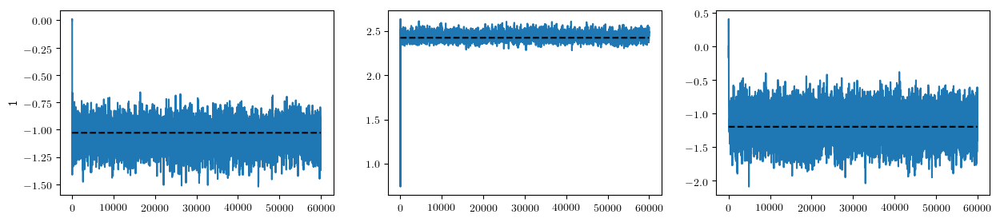

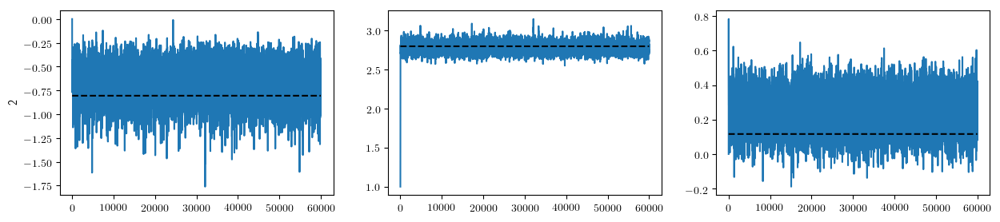

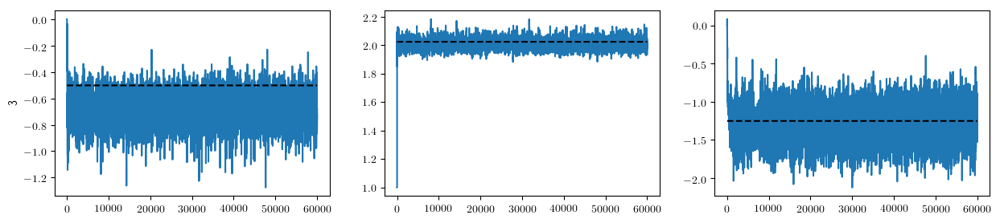

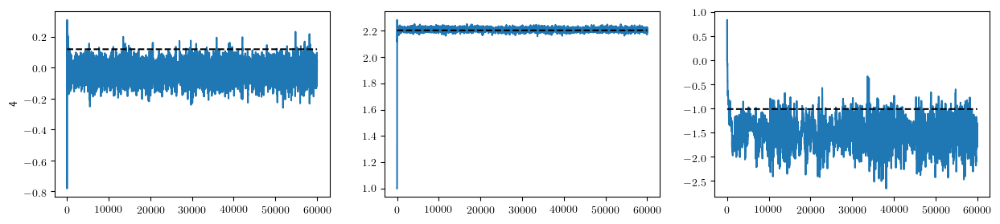

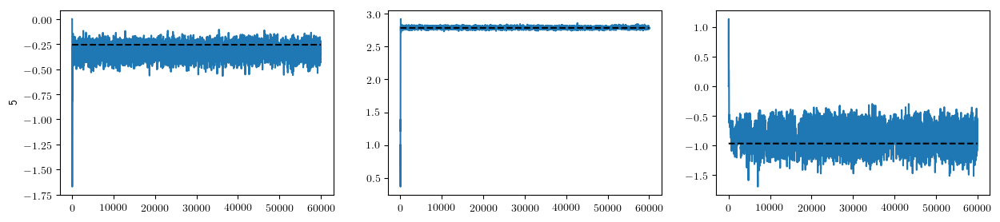

...

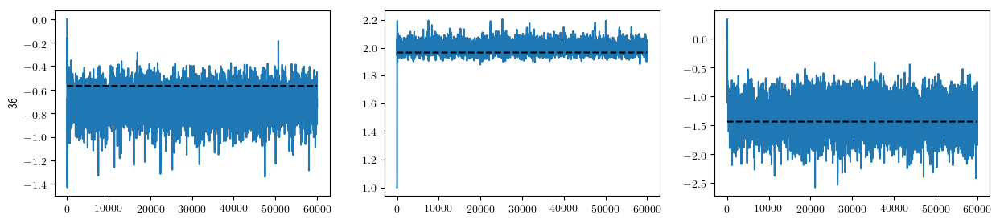

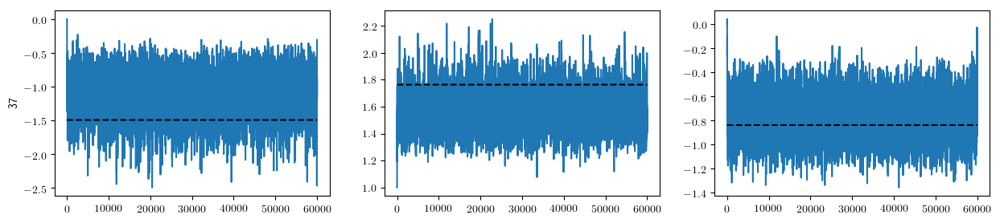

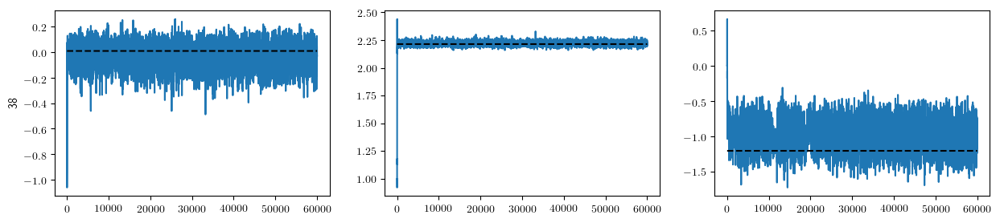

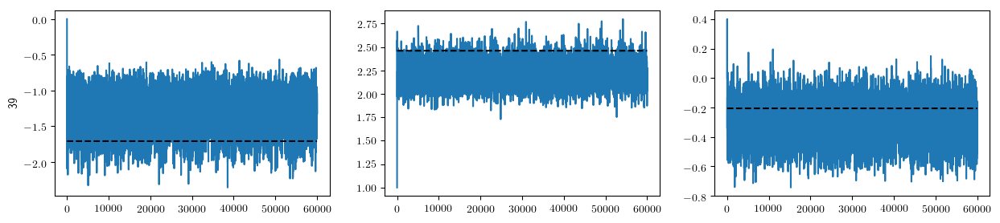

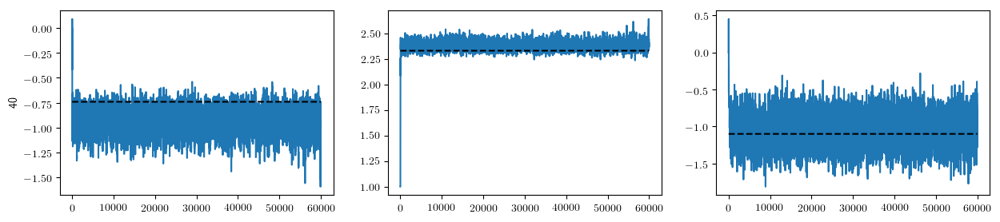

In [12]:
for i in 1:M_subjects
    
    PyPlot.figure(figsize=(15,3))
    
    ax1 = PyPlot.subplot(1,3,1)

    PyPlot.plot(chain_ϕ_kalman[i,1,burn_in_trace:end])
    PyPlot.plot(ϕ[i,1]*ones(R-burn_in_trace), "k--");
    PyPlot.ylabel(i)

    ax1 = PyPlot.subplot(1,3,2)
    PyPlot.plot(chain_ϕ_kalman[i,2,burn_in_trace:end])
    PyPlot.plot(ϕ[i,2]*ones(R-burn_in_trace), "k--");

    ax1 = PyPlot.subplot(1,3,3)
    PyPlot.plot(chain_ϕ_kalman[i,3,burn_in_trace:end])
    PyPlot.plot(ϕ[i,3]*ones(R-burn_in_trace), "k--");
end 

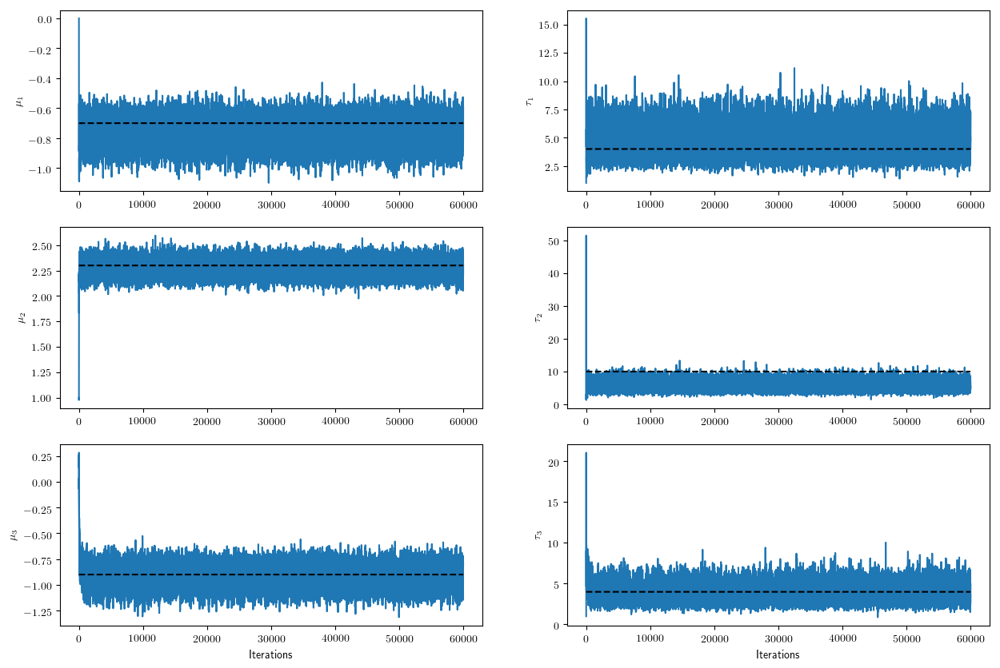

In [13]:
PyPlot.figure(figsize=(15,10))

ax1 = PyPlot.subplot(3,2,1)
PyPlot.plot(chain_η_kalman[1,burn_in_trace:end])
PyPlot.plot(η[1]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_1")

ax1 = PyPlot.subplot(3,2,3)
PyPlot.plot(chain_η_kalman[2,burn_in_trace:end])
PyPlot.plot(η[2]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_2")

ax1 = PyPlot.subplot(3,2,5)
PyPlot.plot(chain_η_kalman[3,burn_in_trace:end])
PyPlot.plot(η[3]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_3")
PyPlot.xlabel("Iterations");

ax1 = PyPlot.subplot(3,2,2)
PyPlot.plot(chain_η_kalman[4,burn_in_trace:end])
PyPlot.plot(η[4]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_1")

ax1 = PyPlot.subplot(3,2,4)
PyPlot.plot(chain_η_kalman[5,burn_in_trace:end])
PyPlot.plot(η[5]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_2")

ax1 = PyPlot.subplot(3,2,6)
PyPlot.plot(chain_η_kalman[6,burn_in_trace:end])
PyPlot.plot(η[6]*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\tau_3")
PyPlot.xlabel("Iterations");

### Run/Load Gibbs sampler with PMMH - naive 

In [14]:
nbr_particles = 3000 
ρ = 0.0

job = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles)*"_"*string(ρ)


"40_200_3000_0.0"

In [15]:
# load stored results
chain_σ_ϵ_pmmh_naive = Matrix(CSV.read("data/SDEMEM OU/naive_cpmmh/chain_sigma_epsilon_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_σ_ϵ_pmmh_naive = Matrix(chain_σ_ϵ_pmmh_naive')
chain_η_pmmh_naive = Matrix(CSV.read("data/SDEMEM OU/naive_cpmmh/chain_eta_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_η_pmmh_naive = Matrix(chain_η_pmmh_naive')
chain_ϕ_export = Matrix(CSV.read("data/SDEMEM OU/naive_cpmmh/chain_phi_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_ϕ_export = Matrix(chain_ϕ_export')
chain_ϕ_pmmh_naive = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_pmmh_naive[m,j,:] = chain_ϕ_export[idx,:]
    end 
end 

simdata_pmmh_naive = Matrix(CSV.read("data/SDEMEM OU/naive_cpmmh/sim_data_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
println(simdata_pmmh_naive[1])
println(simdata_pmmh_naive[2])
println(simdata_pmmh_naive[3])
println(simdata_pmmh_naive[4])

┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330


276437.141773686
0.2517425
0.25593333333333335
1.0


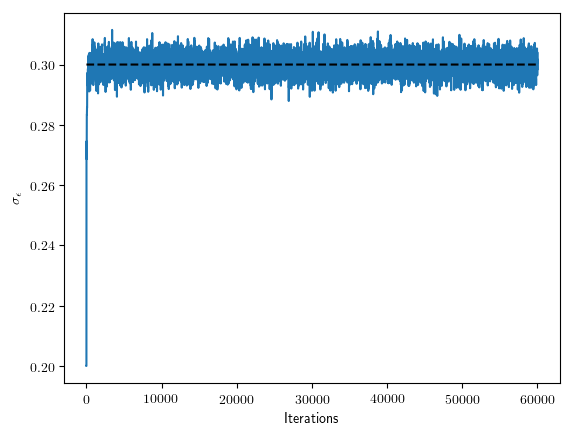

In [16]:
PyPlot.figure()
PyPlot.plot(chain_σ_ϵ_pmmh_naive[1,burn_in_trace:end])
PyPlot.plot(σ_ϵ*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\sigma_{\epsilon}")
PyPlot.xlabel("Iterations");

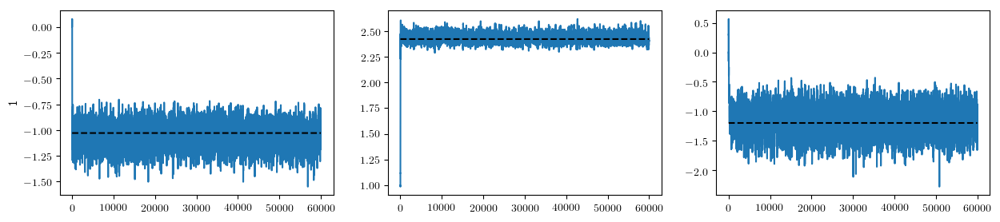

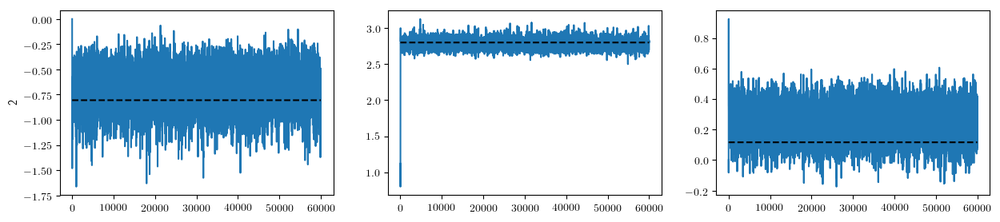

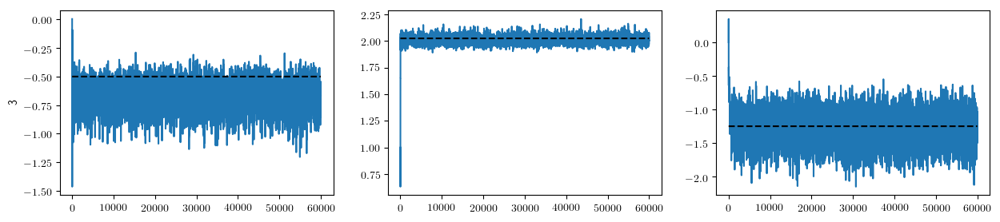

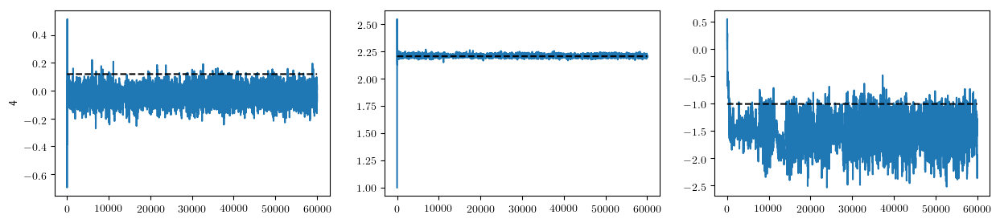

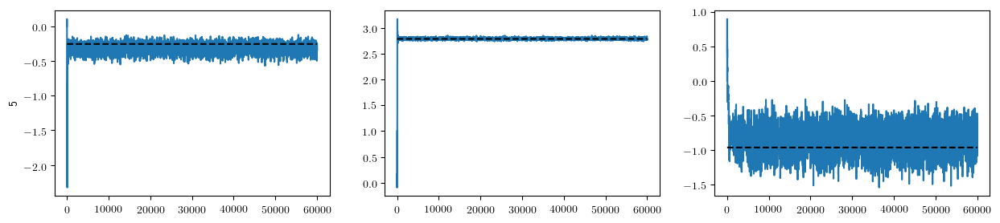

...

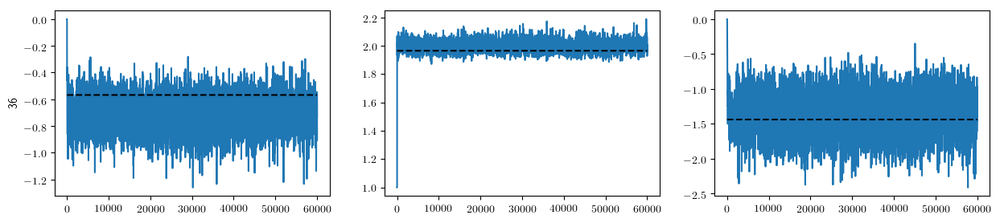

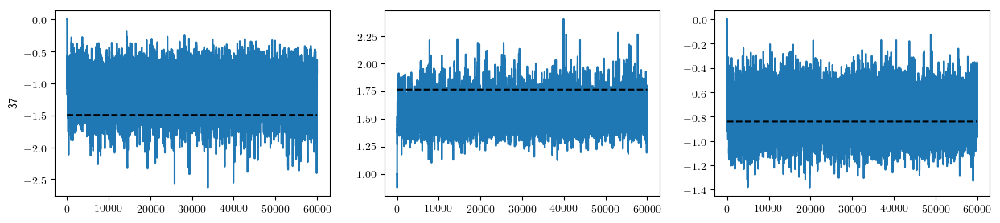

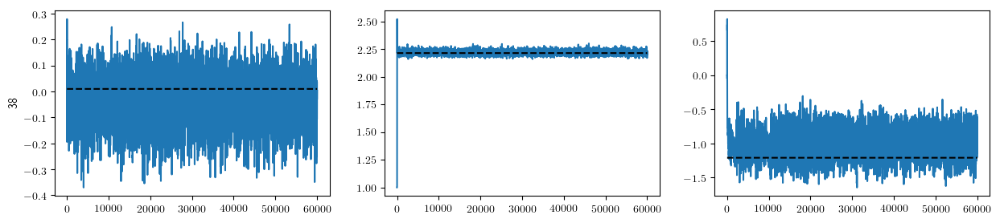

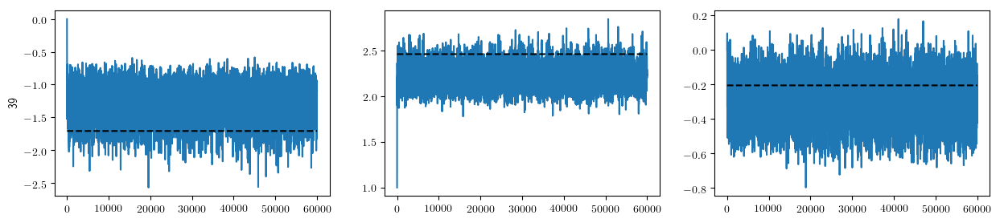

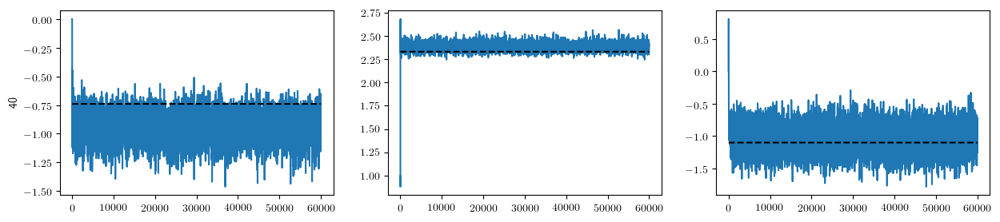

In [17]:
for i in 1:M_subjects
    
    PyPlot.figure(figsize=(15,3))

    
    ax1 = PyPlot.subplot(1,3,1)

    PyPlot.plot(chain_ϕ_pmmh_naive[i,1,burn_in_trace:end])
    PyPlot.plot(ϕ[i,1]*ones(R-burn_in_trace), "k--");
    PyPlot.ylabel(i)
    
    ax1 = PyPlot.subplot(1,3,2)
    PyPlot.plot(chain_ϕ_pmmh_naive[i,2,burn_in_trace:end])
    PyPlot.plot(ϕ[i,2]*ones(R-burn_in_trace), "k--");

    ax1 = PyPlot.subplot(1,3,3)
    PyPlot.plot(chain_ϕ_pmmh_naive[i,3,burn_in_trace:end])
    PyPlot.plot(ϕ[i,3]*ones(R-burn_in_trace), "k--");
end 

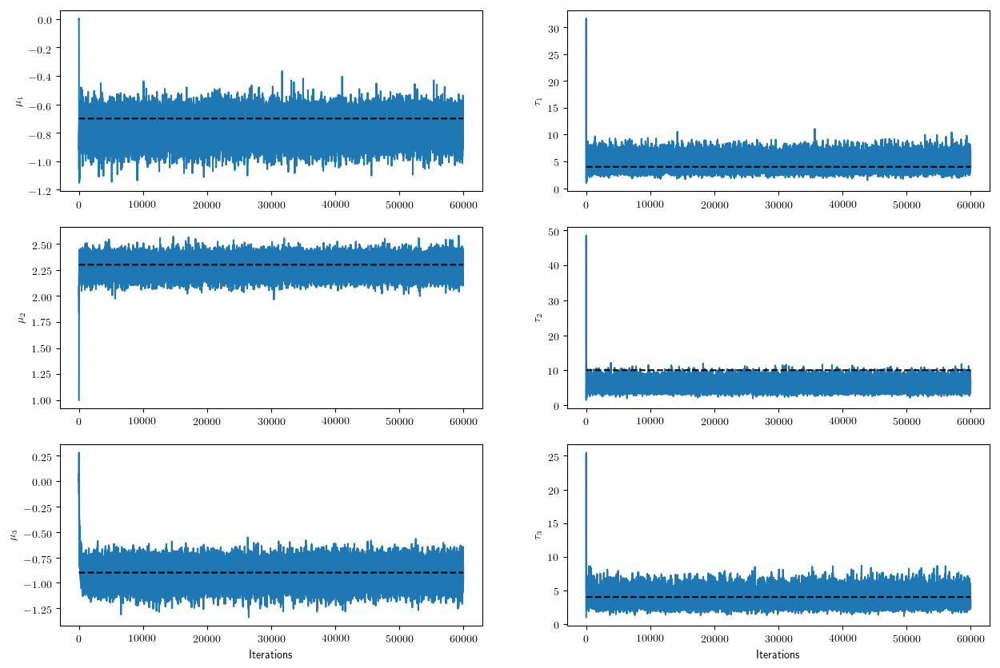

In [18]:
PyPlot.figure(figsize=(15,10))

ax1 = PyPlot.subplot(3,2,1)
PyPlot.plot(chain_η_pmmh_naive[1,burn_in_trace:end])
PyPlot.plot(η[1]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_1")

ax1 = PyPlot.subplot(3,2,3)
PyPlot.plot(chain_η_pmmh_naive[2,burn_in_trace:end])
PyPlot.plot(η[2]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_2")

ax1 = PyPlot.subplot(3,2,5)
PyPlot.plot(chain_η_pmmh_naive[3,burn_in_trace:end])
PyPlot.plot(η[3]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_3")
PyPlot.xlabel("Iterations");

ax1 = PyPlot.subplot(3,2,2)
PyPlot.plot(chain_η_pmmh_naive[4,burn_in_trace:end])
PyPlot.plot(η[4]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_1")

ax1 = PyPlot.subplot(3,2,4)
PyPlot.plot(chain_η_pmmh_naive[5,burn_in_trace:end])
PyPlot.plot(η[5]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_2")

ax1 = PyPlot.subplot(3,2,6)
PyPlot.plot(chain_η_pmmh_naive[6,burn_in_trace:end])
PyPlot.plot(η[6]*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\tau_3")
PyPlot.xlabel("Iterations");

###  PMMH 

In [19]:
nbr_particles = 3000 
ρ = 0.0

#seed = 100
#nbr_particles = 100 

job = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles)*"_"*string(ρ)


"40_200_3000_0.0"

In [20]:
# load stored results
chain_σ_ϵ_pmmh = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_sigma_epsilon_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_σ_ϵ_pmmh = Matrix(chain_σ_ϵ_pmmh')
chain_η_pmmh = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_eta_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_η_pmmh = Matrix(chain_η_pmmh')
chain_ϕ_export = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_phi_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_ϕ_export = Matrix(chain_ϕ_export')
chain_ϕ_pmmh = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_pmmh[m,j,:] = chain_ϕ_export[idx,:]
    end 
end 

simdata_pmmh = Matrix(CSV.read("data/SDEMEM OU/cpmmh/sim_data_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
println(simdata_pmmh[1])
println(simdata_pmmh[2])
println(simdata_pmmh[3])
println(simdata_pmmh[4])

┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330


243731.554100893
0.2522216666666667
0.2546333333333333
1.0


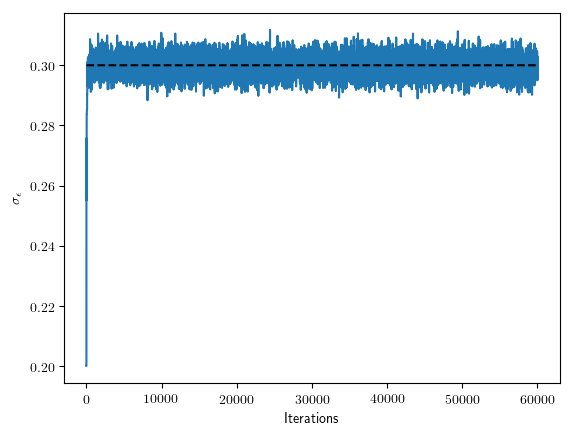

In [21]:
PyPlot.figure()
PyPlot.plot(chain_σ_ϵ_pmmh[1,burn_in_trace:end])
PyPlot.plot(σ_ϵ*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\sigma_{\epsilon}")
PyPlot.xlabel("Iterations");

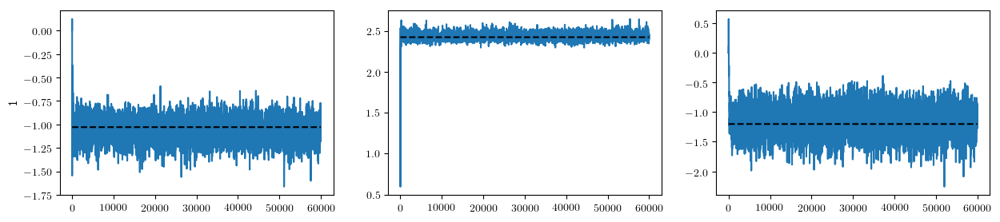

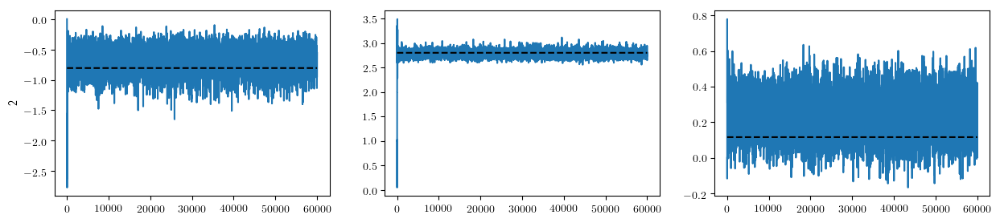

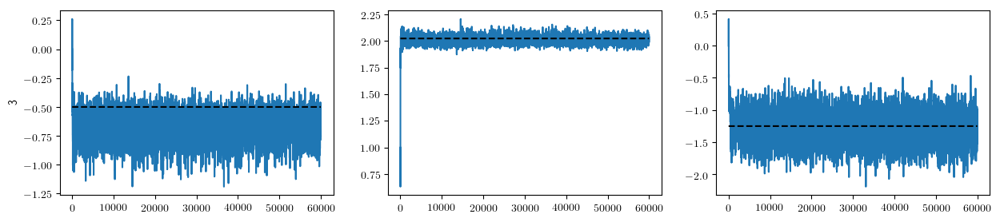

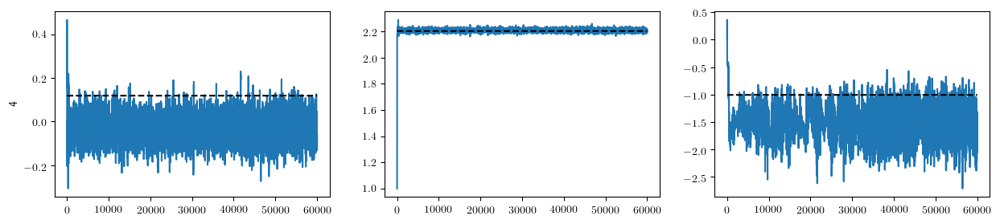

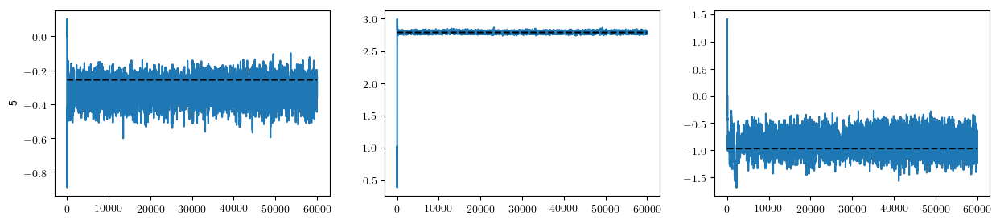

...

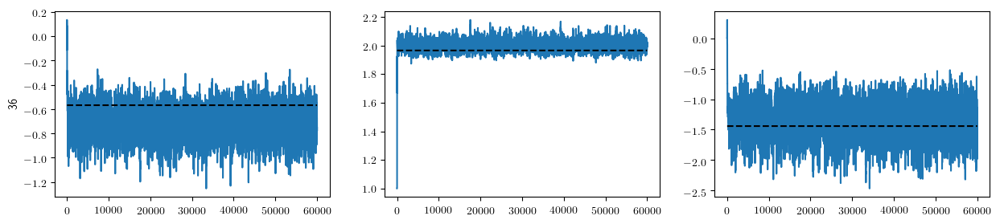

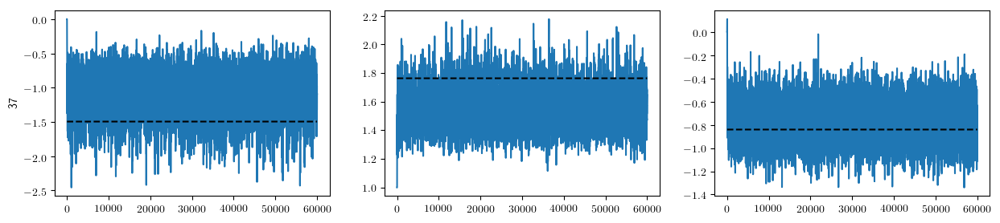

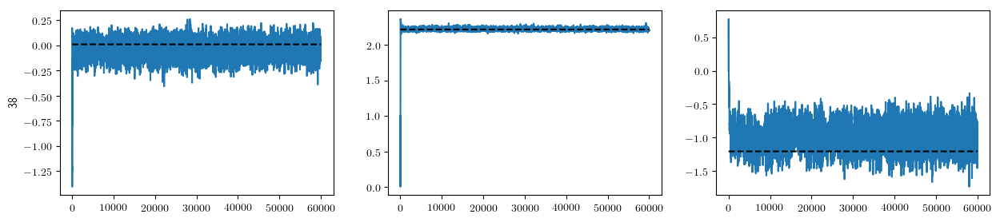

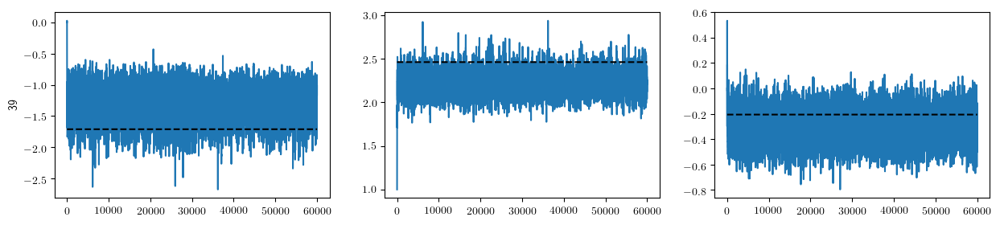

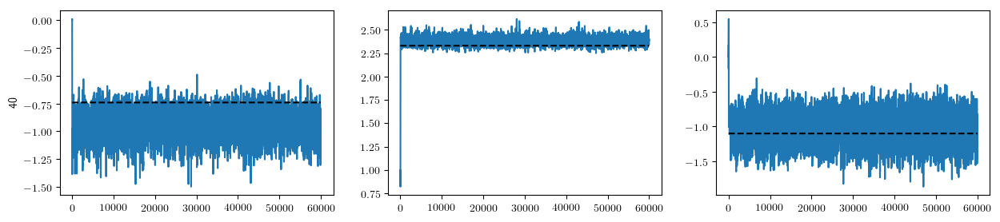

In [22]:
for i in 1:M_subjects
    
    PyPlot.figure(figsize=(15,3))

    
    ax1 = PyPlot.subplot(1,3,1)

    PyPlot.plot(chain_ϕ_pmmh[i,1,burn_in_trace:end])
    PyPlot.plot(ϕ[i,1]*ones(R-burn_in_trace), "k--");
    PyPlot.ylabel(i)
    
    ax1 = PyPlot.subplot(1,3,2)
    PyPlot.plot(chain_ϕ_pmmh[i,2,burn_in_trace:end])
    PyPlot.plot(ϕ[i,2]*ones(R-burn_in_trace), "k--");

    ax1 = PyPlot.subplot(1,3,3)
    PyPlot.plot(chain_ϕ_pmmh[i,3,burn_in_trace:end])
    PyPlot.plot(ϕ[i,3]*ones(R-burn_in_trace), "k--");
end 

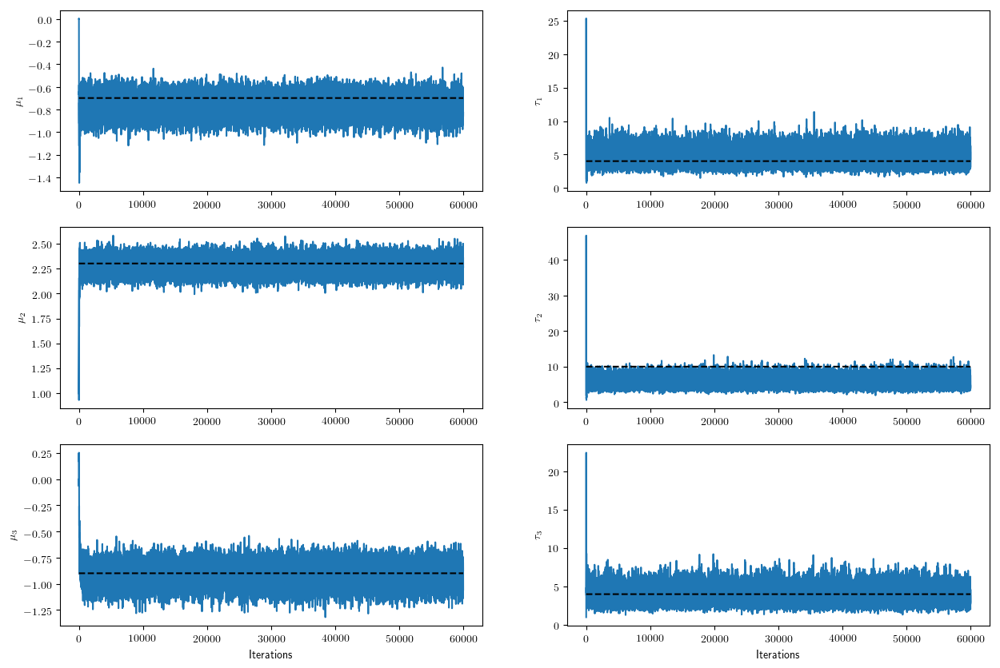

In [23]:
PyPlot.figure(figsize=(15,10))

ax1 = PyPlot.subplot(3,2,1)
PyPlot.plot(chain_η_pmmh[1,burn_in_trace:end])
PyPlot.plot(η[1]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_1")

ax1 = PyPlot.subplot(3,2,3)
PyPlot.plot(chain_η_pmmh[2,burn_in_trace:end])
PyPlot.plot(η[2]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_2")

ax1 = PyPlot.subplot(3,2,5)
PyPlot.plot(chain_η_pmmh[3,burn_in_trace:end])
PyPlot.plot(η[3]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_3")
PyPlot.xlabel("Iterations");

ax1 = PyPlot.subplot(3,2,2)
PyPlot.plot(chain_η_pmmh[4,burn_in_trace:end])
PyPlot.plot(η[4]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_1")

ax1 = PyPlot.subplot(3,2,4)
PyPlot.plot(chain_η_pmmh[5,burn_in_trace:end])
PyPlot.plot(η[5]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_2")

ax1 = PyPlot.subplot(3,2,6)
PyPlot.plot(chain_η_pmmh[6,burn_in_trace:end])
PyPlot.plot(η[6]*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\tau_3")
PyPlot.xlabel("Iterations");

###  CPMMH-0.99 

In [24]:
nbr_particles = 100
ρ = 0.99

job = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles)*"_"*string(ρ)

"40_200_100_0.99"

In [25]:
# load stored results
chain_σ_ϵ_cpmmh099 = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_sigma_epsilon_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_σ_ϵ_cpmmh099 = Matrix(chain_σ_ϵ_cpmmh099')
chain_η_cpmmh099 = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_eta_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_η_cpmmh099 = Matrix(chain_η_cpmmh099')
chain_ϕ_export099 = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_phi_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_ϕ_export099 = Matrix(chain_ϕ_export099')
chain_ϕ_cpmmh099 = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_cpmmh099[m,j,:] = chain_ϕ_export099[idx,:]
    end 
end 


simdata_cpmmh = Matrix(CSV.read("data/SDEMEM OU/cpmmh/sim_data_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
println(simdata_cpmmh[1])
println(simdata_cpmmh[2])
println(simdata_cpmmh[3])
println(simdata_cpmmh[4])


┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330


12561.145641877
0.25126791666666665
0.2579166666666667
1.0


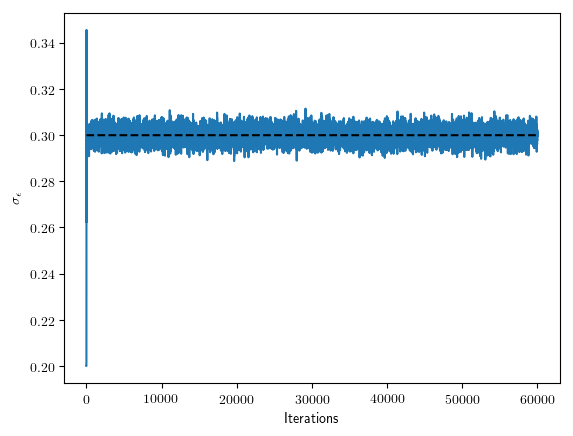

In [26]:
PyPlot.figure()
PyPlot.plot(chain_σ_ϵ_cpmmh099[1,burn_in_trace:end])
PyPlot.plot(σ_ϵ*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\sigma_{\epsilon}")
PyPlot.xlabel("Iterations");

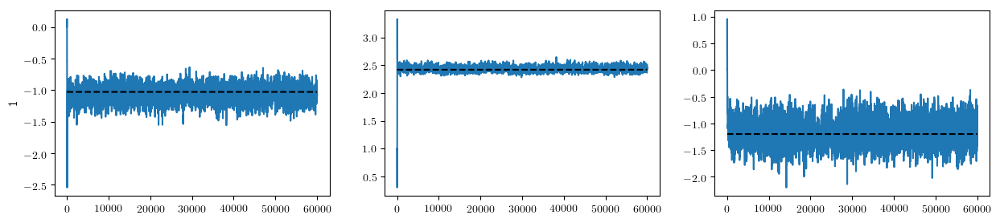

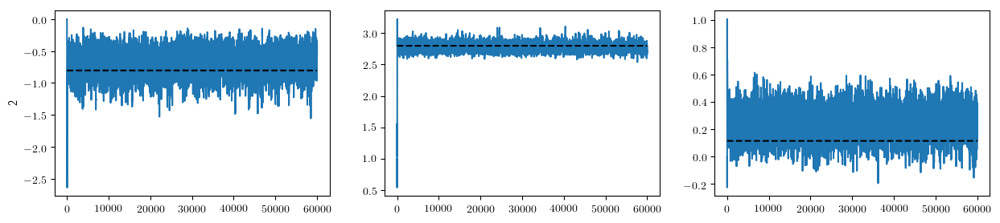

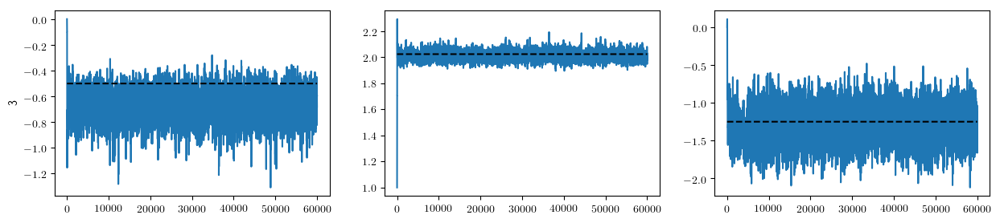

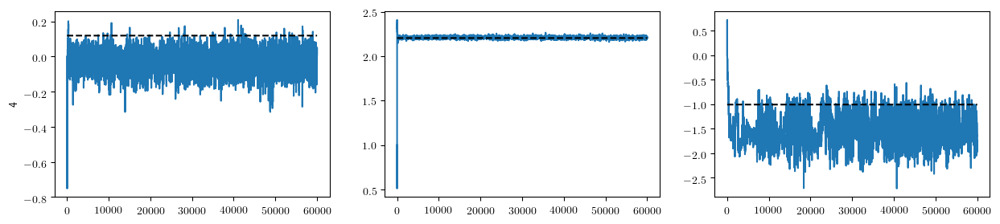

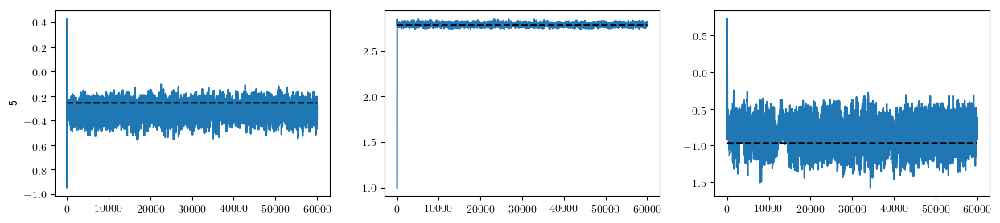

...

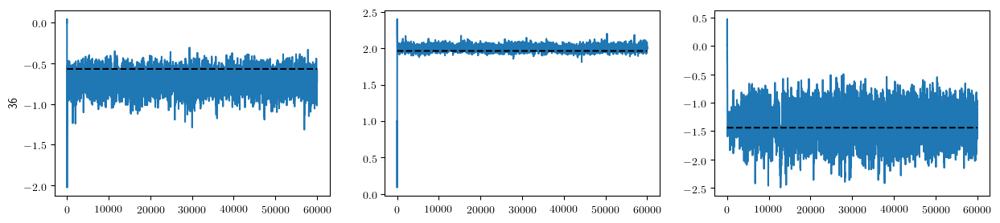

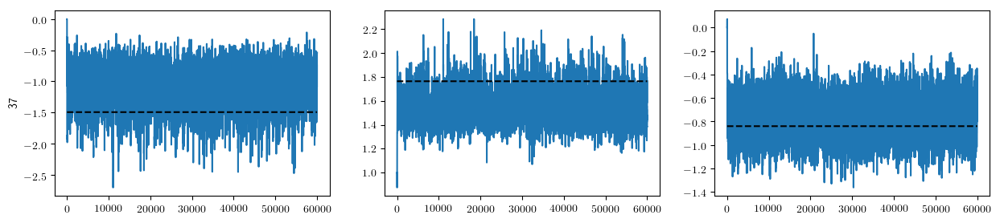

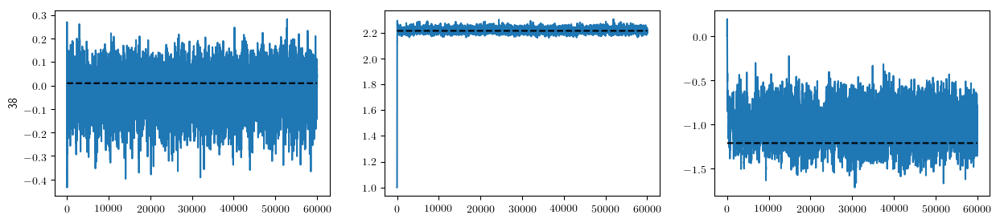

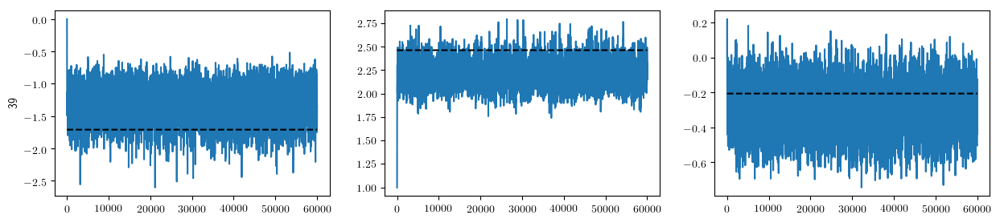

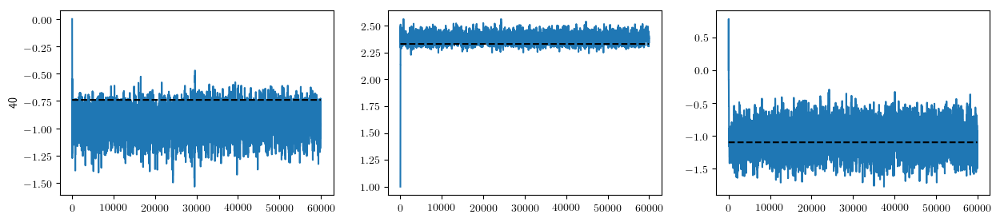

In [27]:
for i in 1:M_subjects
    
    PyPlot.figure(figsize=(15,3))

    
    ax1 = PyPlot.subplot(1,3,1)

    PyPlot.plot(chain_ϕ_cpmmh099[i,1,burn_in_trace:end])
    PyPlot.plot(ϕ[i,1]*ones(R-burn_in_trace), "k--");
    PyPlot.ylabel(i)
    
    ax1 = PyPlot.subplot(1,3,2)
    PyPlot.plot(chain_ϕ_cpmmh099[i,2,burn_in_trace:end])
    PyPlot.plot(ϕ[i,2]*ones(R-burn_in_trace), "k--");

    ax1 = PyPlot.subplot(1,3,3)
    PyPlot.plot(chain_ϕ_cpmmh099[i,3,burn_in_trace:end])
    PyPlot.plot(ϕ[i,3]*ones(R-burn_in_trace), "k--");
end 

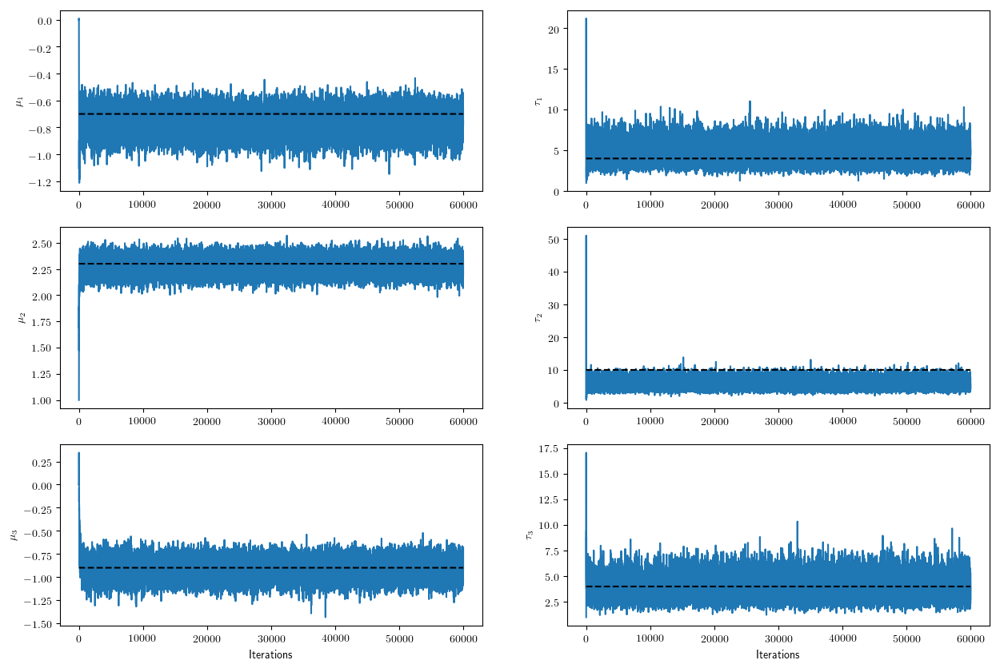

In [28]:
PyPlot.figure(figsize=(15,10))

ax1 = PyPlot.subplot(3,2,1)
PyPlot.plot(chain_η_cpmmh099[1,burn_in_trace:end])
PyPlot.plot(η[1]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_1")

ax1 = PyPlot.subplot(3,2,3)
PyPlot.plot(chain_η_cpmmh099[2,burn_in_trace:end])
PyPlot.plot(η[2]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_2")

ax1 = PyPlot.subplot(3,2,5)
PyPlot.plot(chain_η_cpmmh099[3,burn_in_trace:end])
PyPlot.plot(η[3]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_3")
PyPlot.xlabel("Iterations");

ax1 = PyPlot.subplot(3,2,2)
PyPlot.plot(chain_η_cpmmh099[4,burn_in_trace:end])
PyPlot.plot(η[4]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_1")

ax1 = PyPlot.subplot(3,2,4)
PyPlot.plot(chain_η_cpmmh099[5,burn_in_trace:end])
PyPlot.plot(η[5]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_2")

ax1 = PyPlot.subplot(3,2,6)
PyPlot.plot(chain_η_cpmmh099[6,burn_in_trace:end])
PyPlot.plot(η[6]*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\tau_3")
PyPlot.xlabel("Iterations");


## CPMMH-0.999 50/100

In [36]:
nbr_particles = 100 # 50 or 100
ρ = 0.999

job = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles)*"_"*string(ρ)

"40_200_100_0.999"

In [37]:
seed = 100

100

In [38]:
# load stored results
chain_σ_ϵ_cpmmh0999 = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_sigma_epsilon_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_σ_ϵ_cpmmh0999 = Matrix(chain_σ_ϵ_cpmmh0999')
chain_η_cpmmh0999 = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_eta_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_η_cpmmh0999 = Matrix(chain_η_cpmmh0999')
chain_ϕ_export0999 = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_phi_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
chain_ϕ_export0999 = Matrix(chain_ϕ_export0999')
chain_ϕ_cpmmh0999 = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_cpmmh0999[m,j,:] = chain_ϕ_export0999[idx,:]
    end 
end 


simdata_cpmmh = Matrix(CSV.read("data/SDEMEM OU/cpmmh/sim_data_"*string(seed)*"_"*job*".csv",allowmissing=:auto))
println(simdata_cpmmh[1])
println(simdata_cpmmh[2])
println(simdata_cpmmh[3])
println(simdata_cpmmh[4])


┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330


13577.467080048
0.2517183333333333
0.2565
1.0


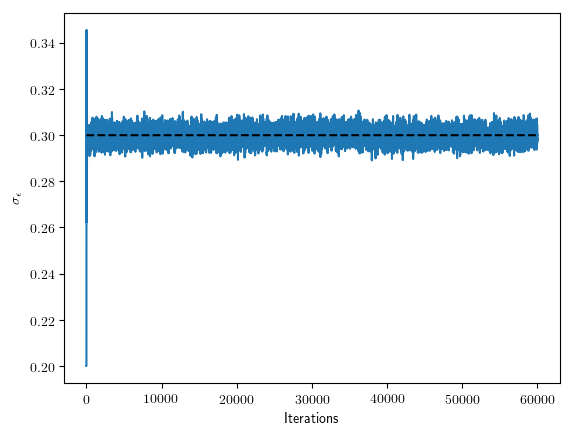

In [39]:
PyPlot.figure()
PyPlot.plot(chain_σ_ϵ_cpmmh0999[1,burn_in_trace:end])
PyPlot.plot(σ_ϵ*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\sigma_{\epsilon}")
PyPlot.xlabel("Iterations");

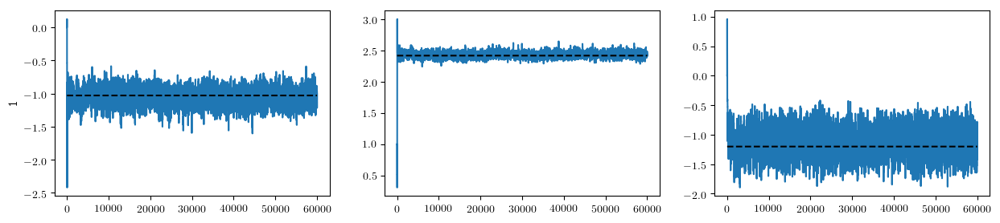

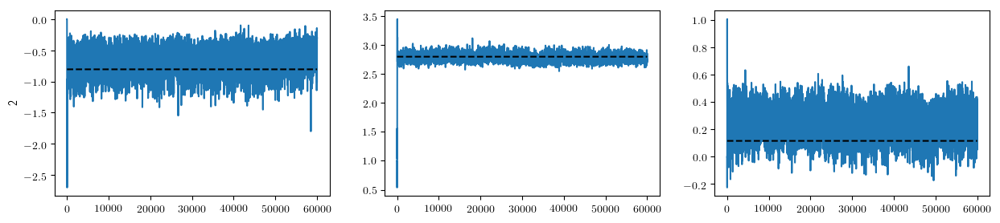

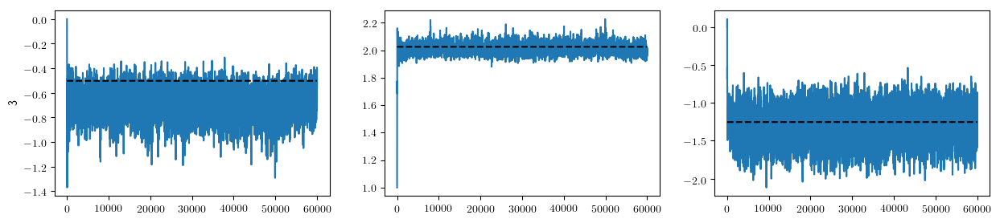

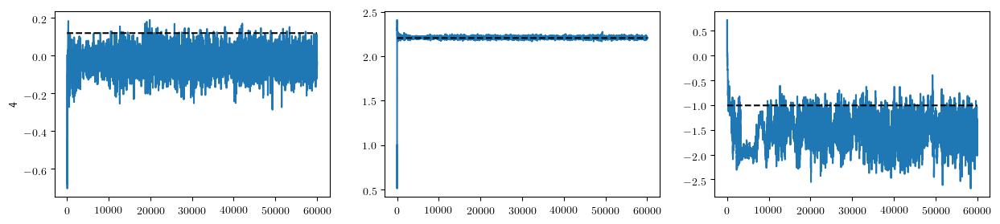

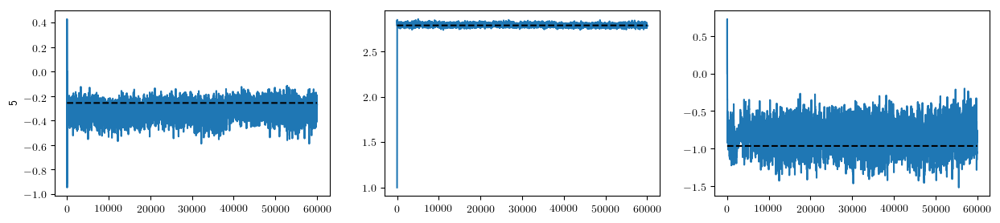

...

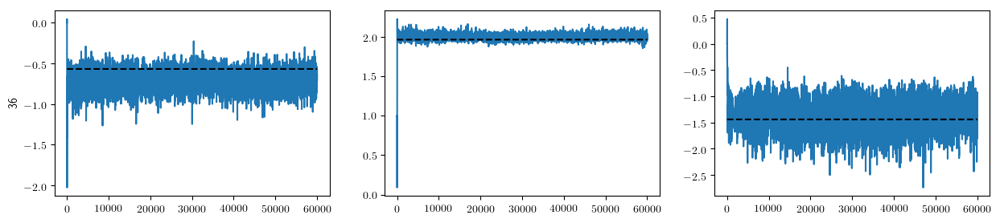

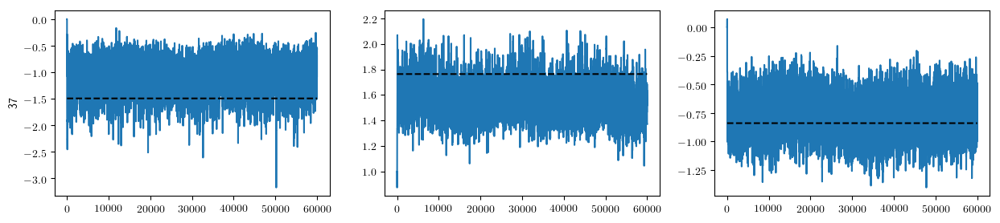

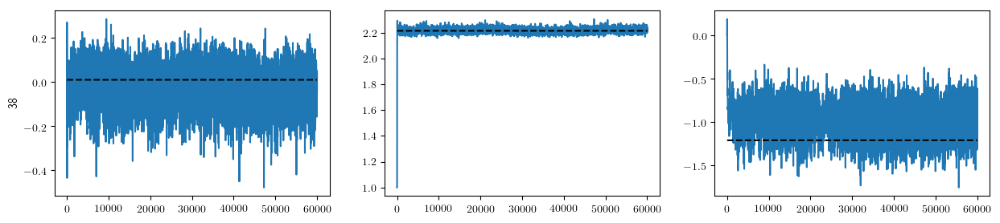

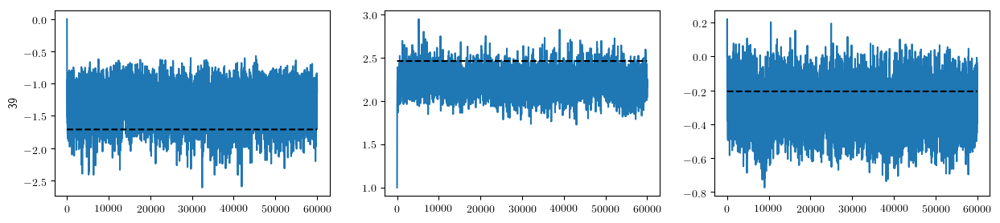

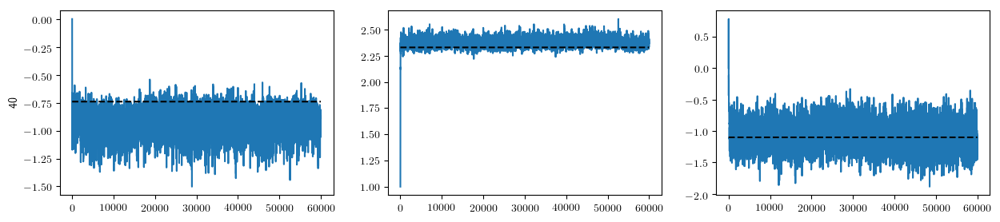

In [40]:
for i in 1:M_subjects
    
    PyPlot.figure(figsize=(15,3))

    
    ax1 = PyPlot.subplot(1,3,1)

    PyPlot.plot(chain_ϕ_cpmmh0999[i,1,burn_in_trace:end])
    PyPlot.plot(ϕ[i,1]*ones(R-burn_in_trace), "k--");
    PyPlot.ylabel(i)
    
    ax1 = PyPlot.subplot(1,3,2)
    PyPlot.plot(chain_ϕ_cpmmh0999[i,2,burn_in_trace:end])
    PyPlot.plot(ϕ[i,2]*ones(R-burn_in_trace), "k--");

    ax1 = PyPlot.subplot(1,3,3)
    PyPlot.plot(chain_ϕ_cpmmh0999[i,3,burn_in_trace:end])
    PyPlot.plot(ϕ[i,3]*ones(R-burn_in_trace), "k--");
end 

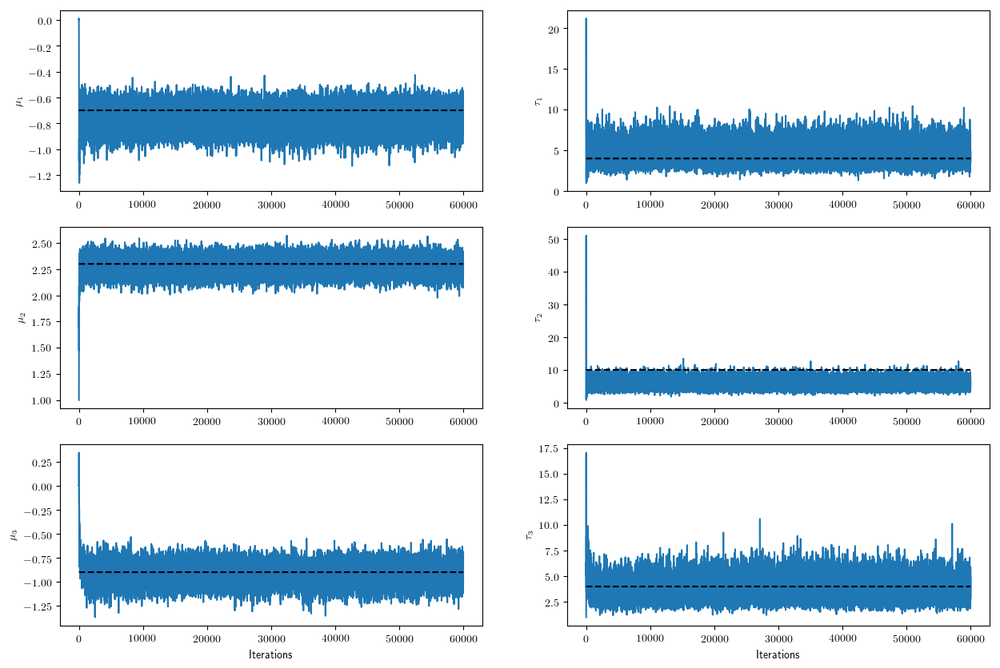

In [41]:
PyPlot.figure(figsize=(15,10))

ax1 = PyPlot.subplot(3,2,1)
PyPlot.plot(chain_η_cpmmh0999[1,burn_in_trace:end])
PyPlot.plot(η[1]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_1")

ax1 = PyPlot.subplot(3,2,3)
PyPlot.plot(chain_η_cpmmh0999[2,burn_in_trace:end])
PyPlot.plot(η[2]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_2")

ax1 = PyPlot.subplot(3,2,5)
PyPlot.plot(chain_η_cpmmh0999[3,burn_in_trace:end])
PyPlot.plot(η[3]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\mu_3")
PyPlot.xlabel("Iterations");

ax1 = PyPlot.subplot(3,2,2)
PyPlot.plot(chain_η_cpmmh0999[4,burn_in_trace:end])
PyPlot.plot(η[4]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_1")

ax1 = PyPlot.subplot(3,2,4)
PyPlot.plot(chain_η_cpmmh0999[5,burn_in_trace:end])
PyPlot.plot(η[5]*ones(R-burn_in_trace), "k--");
PyPlot.ylabel(L"\tau_2")

ax1 = PyPlot.subplot(3,2,6)
PyPlot.plot(chain_η_cpmmh0999[6,burn_in_trace:end])
PyPlot.plot(η[6]*ones(R-burn_in_trace), "k--")
PyPlot.ylabel(L"\tau_3")
PyPlot.xlabel("Iterations");

### Plot posterior dist 

Posterior for Φ. Blue line Kalman, red solid line PMMH, red dashed line CPMMH, black vertical line true value.

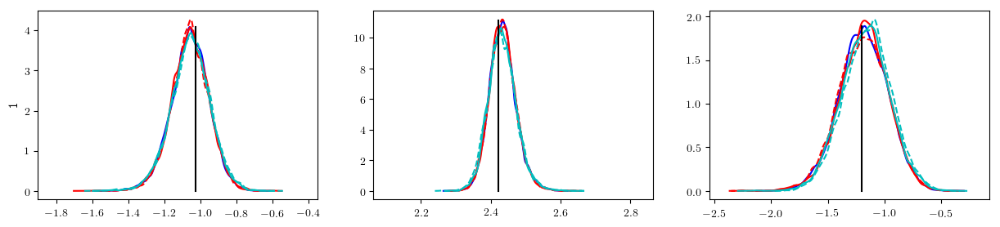

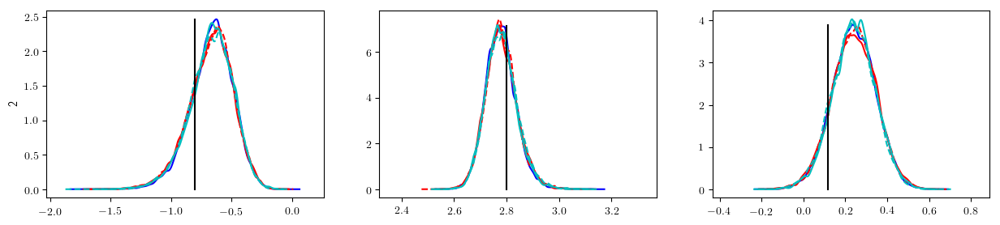

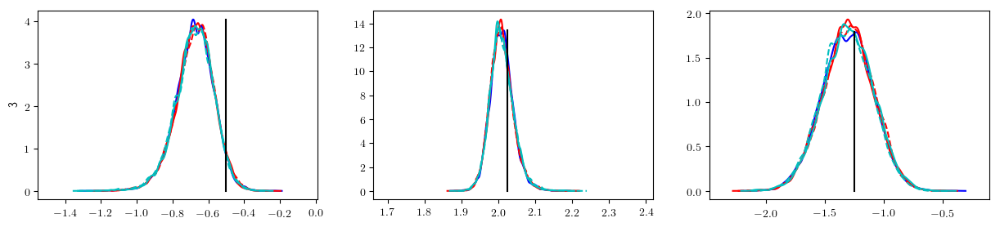

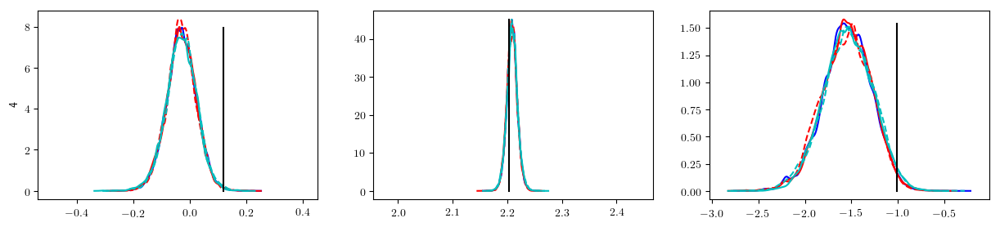

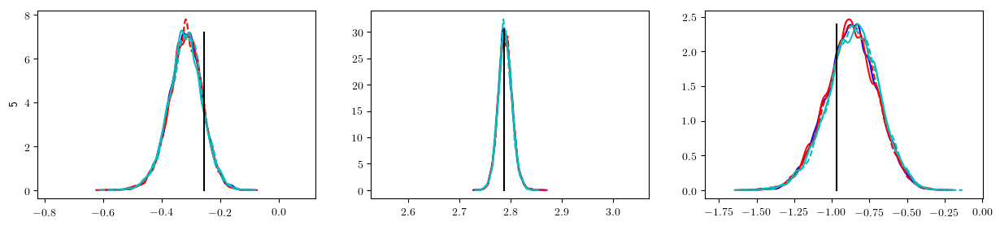

...

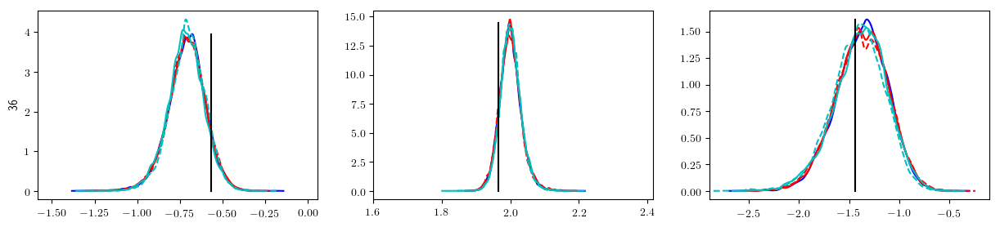

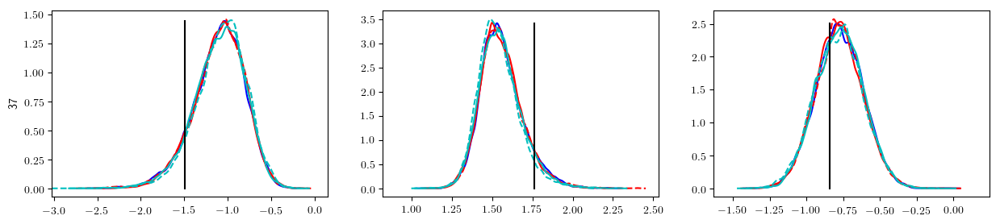

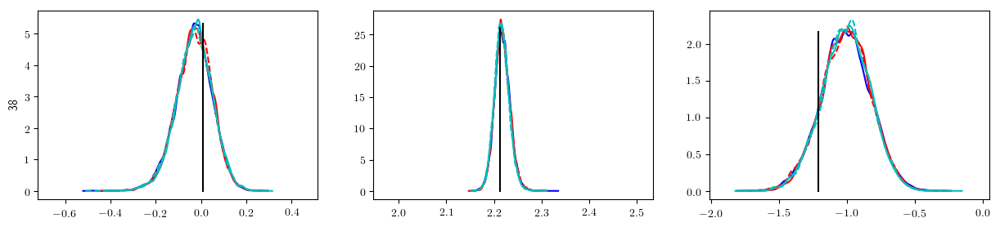

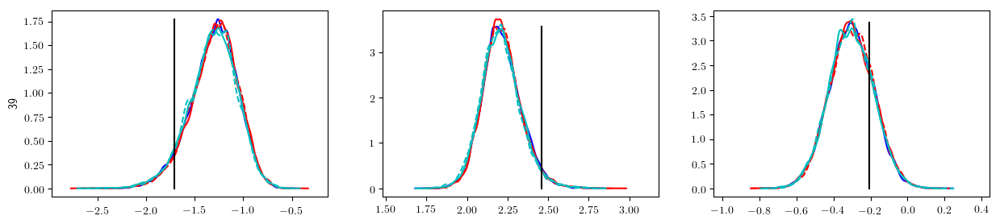

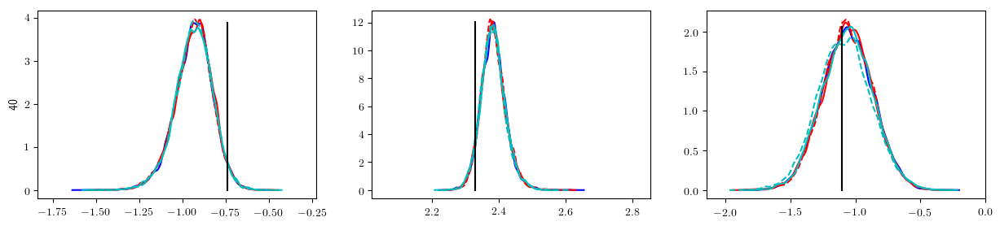

In [37]:
for m in 1:M_subjects
    
    posterior_kalman1 = kde(chain_ϕ_kalman[m,1,burn_in:end])
    posterior_pmmh1 = kde(chain_ϕ_pmmh[m,1,burn_in:end])
    posterior_pmmh_naive1 = kde(chain_ϕ_pmmh_naive[m,1,burn_in:end])
    posterior_cpmmh1099 = kde(chain_ϕ_cpmmh099[m,1,burn_in:end])
    posterior_cpmmh10999 = kde(chain_ϕ_cpmmh0999[m,1,burn_in:end])

    posterior_kalman2 = kde(chain_ϕ_kalman[m,2,burn_in:end])
    posterior_pmmh2 = kde(chain_ϕ_pmmh[m,2,burn_in:end])
    posterior_pmmh_naive2 = kde(chain_ϕ_pmmh_naive[m,2,burn_in:end])
    posterior_cpmmh2099 = kde(chain_ϕ_cpmmh099[m,2,burn_in:end])
    posterior_cpmmh20999 = kde(chain_ϕ_cpmmh0999[m,2,burn_in:end])

    posterior_kalman3 = kde(chain_ϕ_kalman[m,3,burn_in:end])
    posterior_pmmh3 = kde(chain_ϕ_pmmh[m,3,burn_in:end])
    posterior_pmmh_naive3 = kde(chain_ϕ_pmmh_naive[m,3,burn_in:end])
    posterior_cpmmh3099 = kde(chain_ϕ_cpmmh099[m,3,burn_in:end])
    posterior_cpmmh30999 = kde(chain_ϕ_cpmmh0999[m,3,burn_in:end])

    
    PyPlot.figure(figsize=(15,3))

    
    ax1 = PyPlot.subplot(1,3,1)

    PyPlot.plot(posterior_kalman1.x,posterior_kalman1.density, "b")        
    PyPlot.plot(posterior_pmmh1.x,posterior_pmmh1.density, "r")
    PyPlot.plot(posterior_pmmh_naive1.x,posterior_pmmh_naive1.density, "--r")
    PyPlot.plot(posterior_cpmmh1099.x,posterior_cpmmh1099.density, "c")
    PyPlot.plot(posterior_cpmmh10999.x,posterior_cpmmh10999.density, "--c")
    PyPlot.plot((ϕ[m,1], ϕ[m,1]), (0, maximum(posterior_kalman1.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman1.x);
                 minimum(posterior_pmmh1.x);
                 minimum(posterior_cpmmh1099.x)])-0.2, maximum([maximum(posterior_kalman1.x);
                                                             maximum(posterior_pmmh1.x);
                                                             maximum(posterior_cpmmh1099.x)])+0.2));
    PyPlot.ylabel(m)
    
    ax1 = PyPlot.subplot(1,3,2)
    PyPlot.plot(posterior_kalman2.x,posterior_kalman2.density, "b")        
    PyPlot.plot(posterior_pmmh2.x,posterior_pmmh2.density, "r")
    PyPlot.plot(posterior_pmmh_naive2.x,posterior_pmmh_naive2.density, "--r")
    PyPlot.plot(posterior_cpmmh2099.x,posterior_cpmmh2099.density, "c")
    PyPlot.plot(posterior_cpmmh20999.x,posterior_cpmmh20999.density, "--c")
    PyPlot.plot((ϕ[m,2], ϕ[m,2]), (0, maximum(posterior_kalman2.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman2.x);
                 minimum(posterior_pmmh2.x);
                 minimum(posterior_cpmmh2099.x)])-0.2, maximum([maximum(posterior_kalman2.x);
                                                             maximum(posterior_pmmh2.x);
                                                             maximum(posterior_cpmmh2099.x)])+0.2));

    ax1 = PyPlot.subplot(1,3,3)
    PyPlot.plot(posterior_kalman3.x,posterior_kalman3.density, "b")        
    PyPlot.plot(posterior_pmmh3.x,posterior_pmmh3.density, "r")
    PyPlot.plot(posterior_pmmh_naive3.x,posterior_pmmh_naive3.density, "--r")
    PyPlot.plot(posterior_cpmmh3099.x,posterior_cpmmh3099.density, "c")
    PyPlot.plot(posterior_cpmmh30999.x,posterior_cpmmh30999.density, "--c")
    PyPlot.plot((ϕ[m,3], ϕ[m,3]), (0, maximum(posterior_kalman3.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman3.x);
                 minimum(posterior_pmmh3.x);
                 minimum(posterior_cpmmh3099.x)])-0.2, maximum([maximum(posterior_kalman3.x);
                                                             maximum(posterior_pmmh3.x);
                                                             maximum(posterior_cpmmh3099.x)])+0.2));

end 

Posterior for $\sigma_{\epsilon}$. Blue line Kalman, red solid line PMMH, red dashed line CPMMH, black vertical line true value, green line prior.

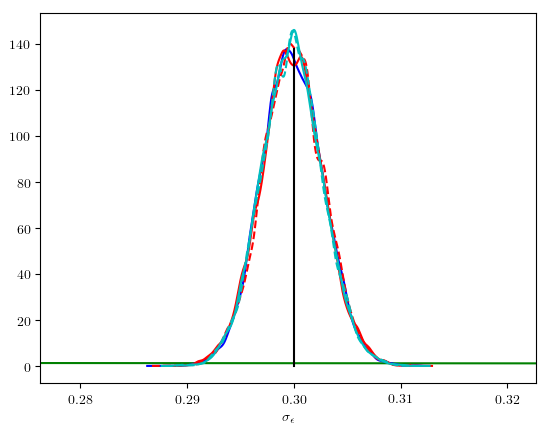

PyObject Text(0.5,24,'$\\sigma_{\\epsilon}$')

In [42]:
prior_grid = LinRange(0,1,100)
prior = pdf.(Gamma(prior_parameters_σ_ϵ[1],1/prior_parameters_σ_ϵ[2]),prior_grid)

# TODO scaling????

posterior_kalman = kde(chain_σ_ϵ_kalman[burn_in:end])
posterior_pmmh = kde(chain_σ_ϵ_pmmh[burn_in:end])
posterior_pmmh_naive = kde(chain_σ_ϵ_pmmh_naive[burn_in:end])
posterior_cpmmh099 = kde(chain_σ_ϵ_cpmmh099[burn_in:end])
posterior_cpmmh0999 = kde(chain_σ_ϵ_cpmmh0999[burn_in:end])

PyPlot.figure()
PyPlot.plot(prior_grid,prior, "g")
PyPlot.plot(posterior_kalman.x,posterior_kalman.density, "b")
PyPlot.plot(posterior_pmmh.x,posterior_pmmh.density, "r")
PyPlot.plot(posterior_pmmh_naive.x,posterior_pmmh_naive.density, "--r")
PyPlot.plot(posterior_cpmmh099.x,posterior_cpmmh099.density, "c")
PyPlot.plot(posterior_cpmmh0999.x,posterior_cpmmh0999.density, "--c")
PyPlot.plot((σ_ϵ, σ_ϵ), (0, maximum(posterior_kalman.density)), "k")
PyPlot.xlim((minimum(posterior_kalman.x)-0.01, maximum(posterior_kalman.x)+0.01));
PyPlot.xlabel(L"\sigma_{\epsilon}")

#PyPlot.savefig("figures/post_sigma_eps_comp1.eps", format="eps", dpi=1000)


In [39]:
save_plots

false

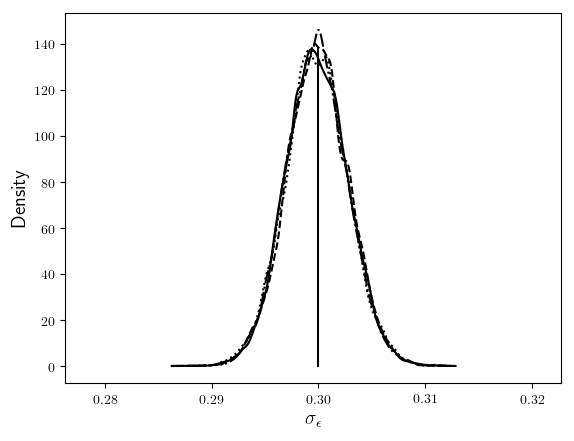

In [40]:
# Fig 2 in paper 

prior_grid = LinRange(0,1,100)
prior = pdf.(Gamma(prior_parameters_σ_ϵ[1],1/prior_parameters_σ_ϵ[2]),prior_grid)

# TODO scaling????

posterior_kalman = kde(chain_σ_ϵ_kalman[burn_in:end])
posterior_pmmh_naive = kde(chain_σ_ϵ_pmmh_naive[burn_in:end])
posterior_pmmh = kde(chain_σ_ϵ_pmmh[burn_in:end])
posterior_cpmmh = kde(chain_σ_ϵ_cpmmh099[burn_in:end])

PyPlot.figure()
PyPlot.plot(posterior_kalman.x,posterior_kalman.density, "k")
PyPlot.plot(posterior_pmmh_naive.x,posterior_pmmh_naive.density, "k--")
PyPlot.plot(posterior_pmmh.x,posterior_pmmh.density, "k:")
PyPlot.plot(posterior_cpmmh.x,posterior_cpmmh.density, "k-.")
PyPlot.plot((σ_ϵ, σ_ϵ), (0, maximum(posterior_kalman.density)), "k")
PyPlot.xlim((minimum(posterior_kalman.x)-0.01, maximum(posterior_kalman.x)+0.01));
PyPlot.xlabel(L"\sigma_{\epsilon}", fontsize=14)
PyPlot.ylabel("Density", fontsize=14)

#PyPlot.savefig("figures/post_sigma_eps_comp1.eps", format="eps", dpi=1000)

if save_plots
    PyPlot.savefig("figures/ou_marginal_post_sigma_epsilon.pdf", format="pdf", dpi=1000)
    run(`pdftops -eps figures/ou_marginal_post_sigma_epsilon.pdf figures/ou_marginal_post_sigma_epsilon.eps`)
end 


Posterior for $\eta$. Blue line Kalman, red solid line PMMH, red dashed line CPMMH, black vertical line true value, green line prior.

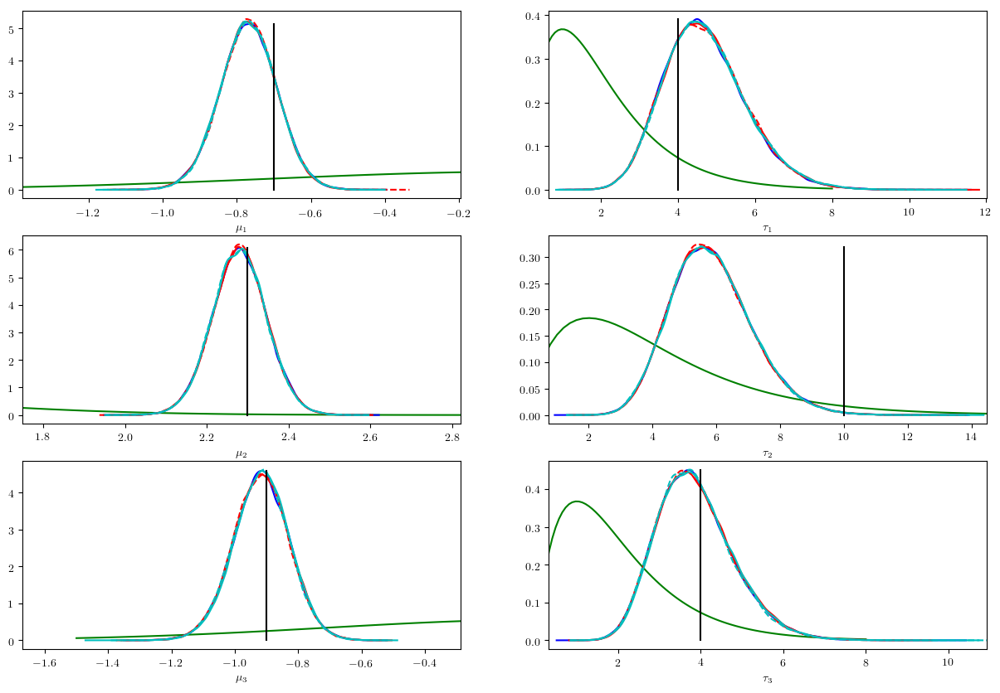

In [41]:
prior_grid_tau = LinRange(0,8,100)
prior_grid_tau2 = LinRange(0,20,100)

prior_tau1 = pdf.(Gamma(prior_parameters_η[1,3],1/prior_parameters_η[1,4]),prior_grid_tau)
prior_tau2 = pdf.(Gamma(prior_parameters_η[2,3],1/prior_parameters_η[2,4]),prior_grid_tau2)
prior_tau3 = pdf.(Gamma(prior_parameters_η[3,3],1/prior_parameters_η[3,4]),prior_grid_tau)

prior_grid_mu13 = prior_grid = LinRange(-1.5,1,100)
prior_grid_mu2 = prior_grid = LinRange(0,3,100)

tau1 = prior_parameters_η[1,3]/prior_parameters_η[1,4]
tau2 = prior_parameters_η[2,3]/prior_parameters_η[2,4]
tau3 = prior_parameters_η[3,3]/prior_parameters_η[3,4]

prior_mu1 = pdf.(Normal(prior_parameters_η[1,1],sqrt(1/(prior_parameters_η[1,2]*tau1))),prior_grid_mu13)
prior_mu2 = pdf.(Normal(prior_parameters_η[2,1],sqrt(1/(prior_parameters_η[2,2]*tau2))),prior_grid_mu2)
prior_mu3 = pdf.(Normal(prior_parameters_η[3,1],sqrt(1/(prior_parameters_η[3,2]*tau3))),prior_grid_mu13)

posterior_kalman1 = kde(chain_η_kalman[1,burn_in:end])
posterior_pmmh1 = kde(chain_η_pmmh[1,burn_in:end])
posterior_pmmh_naive1 = kde(chain_η_pmmh_naive[1,burn_in:end])
posterior_cpmmh1099 = kde(chain_η_cpmmh099[1,burn_in:end])
posterior_cpmmh10999 = kde(chain_η_cpmmh0999[1,burn_in:end])

posterior_kalman2 = kde(chain_η_kalman[2,burn_in:end])
posterior_pmmh2 = kde(chain_η_pmmh[2,burn_in:end])
posterior_pmmh_naive2 = kde(chain_η_pmmh_naive[2,burn_in:end])
posterior_cpmmh2099 = kde(chain_η_cpmmh099[2,burn_in:end])
posterior_cpmmh20999 = kde(chain_η_cpmmh0999[2,burn_in:end])

posterior_kalman3 = kde(chain_η_kalman[3,burn_in:end])
posterior_pmmh3 = kde(chain_η_pmmh[3,burn_in:end])
posterior_pmmh_naive3 = kde(chain_η_pmmh_naive[3,burn_in:end])
posterior_cpmmh3099 = kde(chain_η_cpmmh099[3,burn_in:end])
posterior_cpmmh30999 = kde(chain_η_cpmmh0999[3,burn_in:end])

posterior_kalman4 = kde(chain_η_kalman[4,burn_in:end])
posterior_pmmh4 = kde(chain_η_pmmh[4,burn_in:end])
posterior_pmmh_naive4 = kde(chain_η_pmmh_naive[4,burn_in:end])
posterior_cpmmh4099 = kde(chain_η_cpmmh099[4,burn_in:end])
posterior_cpmmh40999 = kde(chain_η_cpmmh0999[4,burn_in:end])

posterior_kalman5 = kde(chain_η_kalman[5,burn_in:end])
posterior_pmmh5 = kde(chain_η_pmmh[5,burn_in:end])
posterior_pmmh_naive5 = kde(chain_η_pmmh_naive[5,burn_in:end])
posterior_cpmmh5099 = kde(chain_η_cpmmh099[5,burn_in:end])
posterior_cpmmh50999 = kde(chain_η_cpmmh0999[5,burn_in:end])

posterior_kalman6 = kde(chain_η_kalman[6,burn_in:end])
posterior_pmmh6 = kde(chain_η_pmmh[6,burn_in:end])
posterior_pmmh_naive6 = kde(chain_η_pmmh_naive[6,burn_in:end])
posterior_cpmmh6099 = kde(chain_η_cpmmh099[6,burn_in:end])
posterior_cpmmh60999 = kde(chain_η_cpmmh0999[6,burn_in:end])


PyPlot.figure(figsize=(15,10))

ax1 = PyPlot.subplot(3,2,1)
PyPlot.plot(prior_grid_mu13,prior_mu1, "g")
PyPlot.plot(posterior_kalman1.x,posterior_kalman1.density, "b")        
PyPlot.plot(posterior_pmmh1.x,posterior_pmmh1.density, "r")
PyPlot.plot(posterior_pmmh_naive1.x,posterior_pmmh_naive1.density, "--r")
PyPlot.plot(posterior_cpmmh1099.x,posterior_cpmmh1099.density, "c")
PyPlot.plot(posterior_cpmmh10999.x,posterior_cpmmh10999.density, "--c")
PyPlot.plot((η[1], η[1]), (0, maximum(posterior_kalman1.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman1.x);
             minimum(posterior_pmmh1.x);
             minimum(posterior_cpmmh1099.x)])-0.2, maximum([maximum(posterior_kalman1.x);
                                                         maximum(posterior_pmmh1.x);
                                                         maximum(posterior_cpmmh1099.x)])+0.2));
PyPlot.xlabel(L"\mu_1")



ax1 = PyPlot.subplot(3,2,3)
PyPlot.plot(prior_grid_mu2,prior_mu2, "g")
PyPlot.plot(posterior_kalman2.x,posterior_kalman2.density, "b")        
PyPlot.plot(posterior_pmmh2.x,posterior_pmmh2.density, "r")
PyPlot.plot(posterior_pmmh_naive2.x,posterior_pmmh_naive2.density, "--r")
PyPlot.plot(posterior_cpmmh2099.x,posterior_cpmmh2099.density, "c")
PyPlot.plot(posterior_cpmmh20999.x,posterior_cpmmh20999.density, "--c")
PyPlot.plot((η[2], η[2]), (0, maximum(posterior_kalman2.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman2.x);
             minimum(posterior_pmmh2.x);
             minimum(posterior_cpmmh2099.x)])-0.2, maximum([maximum(posterior_kalman2.x);
                                                         maximum(posterior_pmmh2.x);
                                                         maximum(posterior_cpmmh2099.x)])+0.2));

PyPlot.xlabel(L"\mu_2")



ax1 = PyPlot.subplot(3,2,5)
PyPlot.plot(prior_grid_mu13,prior_mu3, "g")
PyPlot.plot(posterior_kalman3.x,posterior_kalman3.density, "b")        
PyPlot.plot(posterior_pmmh3.x,posterior_pmmh3.density, "r")
PyPlot.plot(posterior_pmmh_naive3.x,posterior_pmmh_naive3.density, "--r")
PyPlot.plot(posterior_cpmmh3099.x,posterior_cpmmh3099.density, "c")
PyPlot.plot(posterior_cpmmh30999.x,posterior_cpmmh30999.density, "--c")
PyPlot.plot((η[3], η[3]), (0, maximum(posterior_kalman3.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman3.x);
             minimum(posterior_pmmh3.x);
             minimum(posterior_cpmmh3099.x)])-0.2, maximum([maximum(posterior_kalman3.x);
                                                         maximum(posterior_pmmh3.x);
                                                         maximum(posterior_cpmmh3099.x)])+0.2));

PyPlot.xlabel(L"\mu_3")


ax1 = PyPlot.subplot(3,2,2)
PyPlot.plot(prior_grid_tau,prior_tau1, "g")
PyPlot.plot(posterior_kalman4.x,posterior_kalman4.density, "b")        
PyPlot.plot(posterior_pmmh4.x,posterior_pmmh4.density, "r")
PyPlot.plot(posterior_pmmh_naive4.x,posterior_pmmh_naive4.density, "--r")
PyPlot.plot(posterior_cpmmh4099.x,posterior_cpmmh4099.density, "c")
PyPlot.plot(posterior_cpmmh40999.x,posterior_cpmmh40999.density, "--c")
PyPlot.plot((η[4], η[4]), (0, maximum(posterior_kalman4.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman4.x);
             minimum(posterior_pmmh4.x);
             minimum(posterior_cpmmh4099.x)])-0.2, maximum([maximum(posterior_kalman4.x);
                                                         maximum(posterior_pmmh4.x);
                                                         maximum(posterior_cpmmh4099.x)])+0.2));
PyPlot.xlabel(L"\tau_1")


ax1 = PyPlot.subplot(3,2,4)
PyPlot.plot(prior_grid_tau2,prior_tau2, "g")
PyPlot.plot(posterior_kalman5.x,posterior_kalman5.density, "b")        
PyPlot.plot(posterior_pmmh5.x,posterior_pmmh5.density, "r")
PyPlot.plot(posterior_pmmh_naive5.x,posterior_pmmh_naive5.density, "--r")
PyPlot.plot(posterior_cpmmh5099.x,posterior_cpmmh5099.density, "c")
PyPlot.plot(posterior_cpmmh50999.x,posterior_cpmmh50999.density, "--c")
PyPlot.plot((η[5], η[5]), (0, maximum(posterior_kalman5.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman5.x);
             minimum(posterior_pmmh5.x);
             minimum(posterior_cpmmh5099.x)])-0.2, maximum([maximum(posterior_kalman5.x);
                                                         maximum(posterior_pmmh5.x);
                                                         maximum(posterior_cpmmh5099.x)])+0.1));

PyPlot.xlabel(L"\tau_2")
    

ax1 = PyPlot.subplot(3,2,6)
PyPlot.plot(prior_grid_tau,prior_tau3, "g")
PyPlot.plot(posterior_kalman6.x,posterior_kalman6.density, "b")        
PyPlot.plot(posterior_pmmh6.x,posterior_pmmh6.density, "r")
PyPlot.plot(posterior_pmmh_naive6.x,posterior_pmmh_naive6.density, "--r")
PyPlot.plot(posterior_cpmmh6099.x,posterior_cpmmh6099.density, "c")
PyPlot.plot(posterior_cpmmh60999.x,posterior_cpmmh60999.density, "--c")
PyPlot.plot((η[6], η[6]), (0, maximum(posterior_kalman6.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman6.x);
             minimum(posterior_pmmh6.x);
             minimum(posterior_cpmmh6099.x)])-0.2, maximum([maximum(posterior_kalman6.x);
                                                         maximum(posterior_pmmh6.x);
                                                         maximum(posterior_cpmmh6099.x)])+0.2))
PyPlot.xlabel(L"\tau_3");


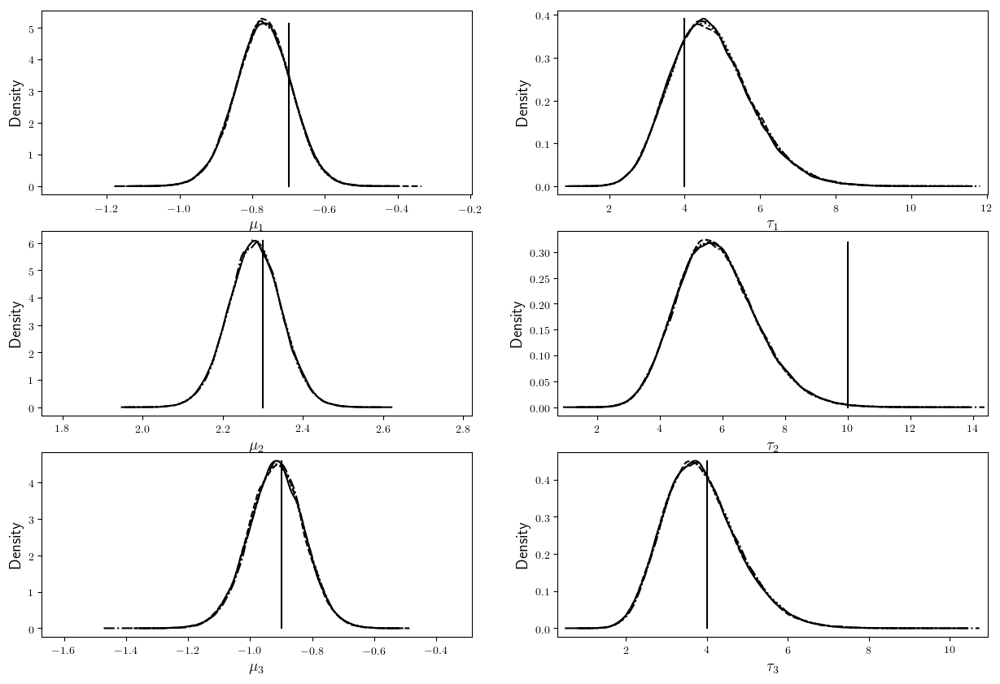

In [42]:
# Fig 3 in paper  

prior_grid_tau = LinRange(0,8,100)
prior_grid_tau2 = LinRange(0,20,100)

prior_tau1 = pdf.(Gamma(prior_parameters_η[1,3],1/prior_parameters_η[1,4]),prior_grid_tau)
prior_tau2 = pdf.(Gamma(prior_parameters_η[2,3],1/prior_parameters_η[2,4]),prior_grid_tau2)
prior_tau3 = pdf.(Gamma(prior_parameters_η[3,3],1/prior_parameters_η[3,4]),prior_grid_tau)

prior_grid_mu13 = prior_grid = LinRange(-1.5,1,100)
prior_grid_mu2 = prior_grid = LinRange(0,3,100)

tau1 = prior_parameters_η[1,3]/prior_parameters_η[1,4]
tau2 = prior_parameters_η[2,3]/prior_parameters_η[2,4]
tau3 = prior_parameters_η[3,3]/prior_parameters_η[3,4]

prior_mu1 = pdf.(Normal(prior_parameters_η[1,1],sqrt(1/(prior_parameters_η[1,2]*tau1))),prior_grid_mu13)
prior_mu2 = pdf.(Normal(prior_parameters_η[2,1],sqrt(1/(prior_parameters_η[2,2]*tau2))),prior_grid_mu2)
prior_mu3 = pdf.(Normal(prior_parameters_η[3,1],sqrt(1/(prior_parameters_η[3,2]*tau3))),prior_grid_mu13)

posterior_kalman1 = kde(chain_η_kalman[1,burn_in:end])
posterior_pmmh1 = kde(chain_η_pmmh[1,burn_in:end])
posterior_pmmh_naive1 = kde(chain_η_pmmh_naive[1,burn_in:end])
posterior_cpmmh1 = kde(chain_η_cpmmh099[1,burn_in:end])

posterior_kalman2 = kde(chain_η_kalman[2,burn_in:end])
posterior_pmmh2 = kde(chain_η_pmmh[2,burn_in:end])
posterior_pmmh_naive2 = kde(chain_η_pmmh_naive[1,burn_in:end])
posterior_cpmmh2 = kde(chain_η_cpmmh099[2,burn_in:end])

posterior_kalman3 = kde(chain_η_kalman[3,burn_in:end])
posterior_pmmh3 = kde(chain_η_pmmh[3,burn_in:end])
posterior_pmmh_naive3 = kde(chain_η_pmmh_naive[3,burn_in:end])
posterior_cpmmh3 = kde(chain_η_cpmmh099[3,burn_in:end])

posterior_kalman4 = kde(chain_η_kalman[4,burn_in:end])
posterior_pmmh4 = kde(chain_η_pmmh[4,burn_in:end])
posterior_pmmh_naive4 = kde(chain_η_pmmh_naive[4,burn_in:end])
posterior_cpmmh4 = kde(chain_η_cpmmh099[4,burn_in:end])

posterior_kalman5 = kde(chain_η_kalman[5,burn_in:end])
posterior_pmmh5 = kde(chain_η_pmmh[5,burn_in:end])
posterior_pmmh_naive5 = kde(chain_η_pmmh_naive[5,burn_in:end])
posterior_cpmmh5 = kde(chain_η_cpmmh099[5,burn_in:end])

posterior_kalman6 = kde(chain_η_kalman[6,burn_in:end])
posterior_pmmh6 = kde(chain_η_pmmh[6,burn_in:end])
posterior_pmmh_naive6 = kde(chain_η_pmmh_naive[6,burn_in:end])
posterior_cpmmh6 = kde(chain_η_cpmmh099[6,burn_in:end])


PyPlot.figure(figsize=(15,10))

ax1 = PyPlot.subplot(3,2,1)
PyPlot.plot(posterior_kalman1.x,posterior_kalman1.density, "k")
PyPlot.plot(posterior_pmmh_naive1.x,posterior_pmmh_naive1.density, "k--")
PyPlot.plot(posterior_pmmh1.x,posterior_pmmh1.density, "k:")
PyPlot.plot(posterior_cpmmh1.x,posterior_cpmmh1.density, "k-.")
PyPlot.plot((η[1], η[1]), (0, maximum(posterior_kalman1.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman1.x);
             minimum(posterior_pmmh1.x);
             minimum(posterior_cpmmh1.x)])-0.2, maximum([maximum(posterior_kalman1.x);
                                                         maximum(posterior_pmmh1.x);
                                                         maximum(posterior_cpmmh1.x)])+0.2));
PyPlot.xlabel(L"\mu_1",fontsize=14)
PyPlot.ylabel("Density",fontsize=14);



ax1 = PyPlot.subplot(3,2,3)
PyPlot.plot(posterior_kalman2.x,posterior_kalman2.density, "k")
PyPlot.plot(posterior_pmmh_naive2.x,posterior_pmmh_naive2.density, "k--")
PyPlot.plot(posterior_pmmh2.x,posterior_pmmh2.density, "k:")
PyPlot.plot(posterior_cpmmh2.x,posterior_cpmmh2.density, "k-.")
PyPlot.plot((η[2], η[2]), (0, maximum(posterior_kalman2.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman2.x);
             minimum(posterior_pmmh2.x);
             minimum(posterior_cpmmh2.x)])-0.2, maximum([maximum(posterior_kalman2.x);
                                                         maximum(posterior_pmmh2.x);
                                                         maximum(posterior_cpmmh2.x)])+0.2));

PyPlot.xlabel(L"\mu_2",fontsize=14)
PyPlot.ylabel("Density",fontsize=14);



ax1 = PyPlot.subplot(3,2,5)
PyPlot.plot(posterior_kalman3.x,posterior_kalman3.density, "k")
PyPlot.plot(posterior_pmmh_naive3.x,posterior_pmmh_naive3.density, "k--")
PyPlot.plot(posterior_pmmh3.x,posterior_pmmh3.density, "k:")
PyPlot.plot(posterior_cpmmh3.x,posterior_cpmmh3.density, "k-.")
PyPlot.plot((η[3], η[3]), (0, maximum(posterior_kalman3.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman3.x);
             minimum(posterior_pmmh3.x);
             minimum(posterior_cpmmh3.x)])-0.2, maximum([maximum(posterior_kalman3.x);
                                                         maximum(posterior_pmmh3.x);
                                                         maximum(posterior_cpmmh3.x)])+0.2));

PyPlot.xlabel(L"\mu_3",fontsize=14)
PyPlot.ylabel("Density",fontsize=14);


ax1 = PyPlot.subplot(3,2,2)
PyPlot.plot(posterior_kalman4.x,posterior_kalman4.density, "k")
PyPlot.plot(posterior_pmmh_naive4.x,posterior_pmmh_naive4.density, "k--")
PyPlot.plot(posterior_pmmh4.x,posterior_pmmh4.density, "k:")
PyPlot.plot(posterior_cpmmh4.x,posterior_cpmmh4.density, "k-.")
PyPlot.plot((η[4], η[4]), (0, maximum(posterior_kalman4.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman4.x);
             minimum(posterior_pmmh4.x);
             minimum(posterior_cpmmh4.x)])-0.2, maximum([maximum(posterior_kalman4.x);
                                                         maximum(posterior_pmmh4.x);
                                                         maximum(posterior_cpmmh4.x)])+0.2));
PyPlot.xlabel(L"\tau_1",fontsize=14)
PyPlot.ylabel("Density",fontsize=14);


ax1 = PyPlot.subplot(3,2,4)
PyPlot.plot(posterior_kalman5.x,posterior_kalman5.density, "k")
PyPlot.plot(posterior_pmmh_naive5.x,posterior_pmmh_naive5.density, "k--")
PyPlot.plot(posterior_pmmh5.x,posterior_pmmh5.density, "k:")
PyPlot.plot(posterior_cpmmh5.x,posterior_cpmmh5.density, "k-.")
PyPlot.plot((η[5], η[5]), (0, maximum(posterior_kalman5.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman5.x);
             minimum(posterior_pmmh5.x);
             minimum(posterior_cpmmh5.x)])-0.2, maximum([maximum(posterior_kalman5.x);
                                                         maximum(posterior_pmmh5.x);
                                                         maximum(posterior_cpmmh5.x)])+0.1));

PyPlot.xlabel(L"\tau_2",fontsize=14)
PyPlot.ylabel("Density",fontsize=14);


ax1 = PyPlot.subplot(3,2,6)
PyPlot.plot(posterior_kalman6.x,posterior_kalman6.density, "k")
PyPlot.plot(posterior_pmmh_naive6.x,posterior_pmmh_naive6.density, "k--")
PyPlot.plot(posterior_pmmh6.x,posterior_pmmh6.density, "k:")
PyPlot.plot(posterior_cpmmh6.x,posterior_cpmmh6.density, "k-.")
PyPlot.plot((η[6], η[6]), (0, maximum(posterior_kalman6.density)), "k")
PyPlot.xlim((minimum([minimum(posterior_kalman6.x);
             minimum(posterior_pmmh6.x);
             minimum(posterior_cpmmh6.x)])-0.2, maximum([maximum(posterior_kalman6.x);
                                                         maximum(posterior_pmmh6.x);
                                                         maximum(posterior_cpmmh6.x)])+0.2))
PyPlot.xlabel(L"\tau_3",fontsize=14);
PyPlot.ylabel("Density",fontsize=14);


if save_plots
    PyPlot.savefig("figures/ou_marginal_post_eta.pdf", format="pdf", dpi=1000)
    run(`pdftops -eps figures/ou_marginal_post_eta.pdf figures/ou_marginal_post_eta.eps`)
end 


## Multiple data sets

In [43]:
seed = [100;200;300;400;500]

5-element Array{Int64,1}:
 100
 200
 300
 400
 500

In [44]:
burn_in = 10000

10000

Simulate data for different seeds 

In [45]:
N_time = 200
M_subjects = 40

y = zeros(M_subjects, N_time, length(seed))

for i in 1:length(seed)
    y[:,:,i],x,t_vec,dt,η,σ_ϵ,ϕ,prior_parameters_η,prior_parameters_σ_ϵ = set_up(M=M_subjects,N=N_time, seed = seed[i])    
end     

Plot data 

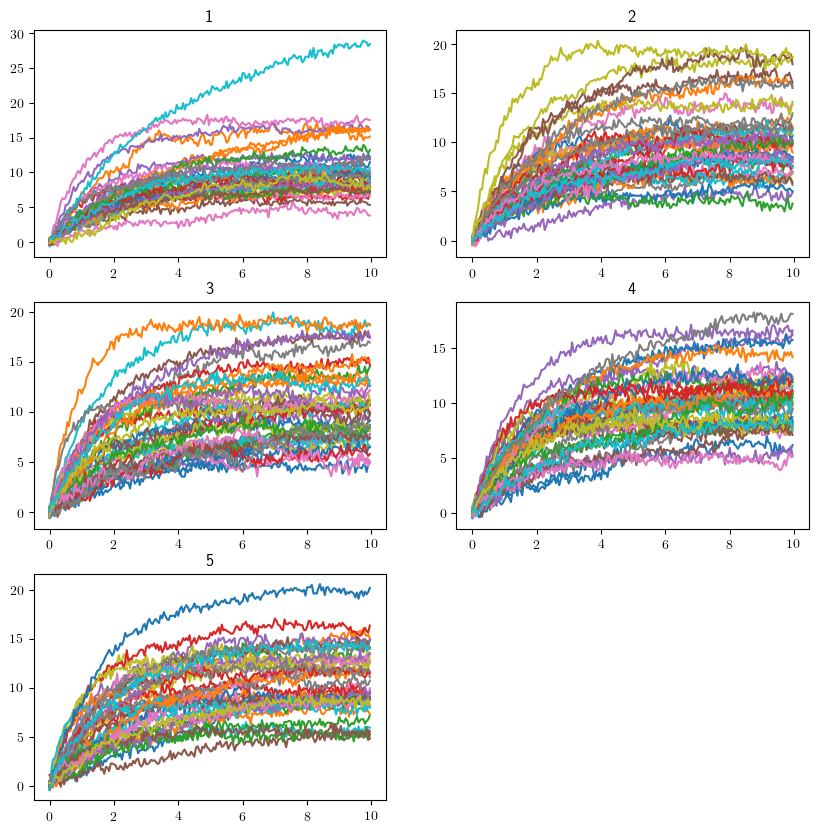

In [46]:
PyPlot.figure(figsize=(10,10))
for i in 1:length(seed)
    PyPlot.subplot(3,2,i)
    PyPlot.plot(t_vec,Array(y[:,:,i]'));
    #PyPlot.plot(t_vec,y[7,:,i]'[:]);
    PyPlot.title(i)

end
    



In [465]:
y[17,:,1]'[:]

200-element Array{Float64,1}:
 -0.019961971651731827
  0.3094844370246993  
  0.6943795039869785  
  1.4467756419421864  
  1.6702163501249487  
  2.446498042239071   
  2.219992188698319   
  2.815481739642586   
  2.8438558509429064  
  3.686528206913399   
  3.6450452932187547  
  3.7678695628534262  
  4.341060442183696   
  ⋮                   
 10.22911970103804    
 10.028920648897559   
  9.953642844336255   
 10.113423690433649   
 10.380146926052507   
 10.436474933418427   
  9.784189047259348   
 10.599682050709642   
 10.508071098658943   
 10.432471775075271   
 10.228097352763767   
  9.610579327381581   

In [47]:
seed

5-element Array{Int64,1}:
 100
 200
 300
 400
 500

In [48]:
seed_temp = seed[2]

200

In [49]:
nbr_particles1 = 100
nbr_particles2 = 50 # 50 or 100
ρ1 = 0.99
ρ2 = 0.999

nbr_particles_pmmh = 3000 
ρ_pmmh = 0.0

#job = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles)*"_"*string(ρ)

job_kalman = string(M_subjects)*"_"*string(N_time)
job_cpmmh099 = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles1)*"_"*string(ρ1)
job_cpmmh0999 = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles2)*"_"*string(ρ2)
job_pmmh_naive = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles_pmmh)*"_"*string(ρ_pmmh)
job_pmmh = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles_pmmh)*"_"*string(ρ_pmmh)



chain_ϕ_export = Matrix(CSV.read("data/SDEMEM OU/kalman/chain_phi_"*string(seed_temp)*"_"*job_kalman*".csv",allowmissing=:auto))
chain_ϕ_export = Matrix(chain_ϕ_export')
chain_ϕ_kalman = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_kalman[m,j,:] = chain_ϕ_export[idx,:]
    end 
end 


chain_ϕ_export = Matrix(CSV.read("data/SDEMEM OU/naive_cpmmh/chain_phi_"*string(seed_temp)*"_"*job_pmmh_naive*".csv",allowmissing=:auto))
chain_ϕ_export = Matrix(chain_ϕ_export')
chain_ϕ_pmmh_naive = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_pmmh_naive[m,j,:] = chain_ϕ_export[idx,:]
    end 
end 

chain_ϕ_export = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_phi_"*string(seed_temp)*"_"*job_pmmh*".csv",allowmissing=:auto))
chain_ϕ_export = Matrix(chain_ϕ_export')
chain_ϕ_pmmh = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_pmmh[m,j,:] = chain_ϕ_export[idx,:]
    end 
end 


chain_ϕ_export099 = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_phi_"*string(seed_temp)*"_"*job_cpmmh099*".csv",allowmissing=:auto))
chain_ϕ_export099 = Matrix(chain_ϕ_export099')
chain_ϕ_cpmmh099 = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_cpmmh099[m,j,:] = chain_ϕ_export099[idx,:]
    end 
end 



chain_ϕ_export0999 = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_phi_"*string(seed_temp)*"_"*job_cpmmh0999*".csv",allowmissing=:auto))
chain_ϕ_export0999 = Matrix(chain_ϕ_export0999')
chain_ϕ_cpmmh0999 = zeros(M_subjects,3,R)
idx = 0 
for m = 1:M_subjects
    for j = 1:3
        idx = idx + 1
        chain_ϕ_cpmmh0999[m,j,:] = chain_ϕ_export0999[idx,:]
    end 
end 

out1,out2,out3,out4,out5,out6,ϕ,out7,out8 = set_up(M=M_subjects,N=N_time, seed = seed_temp)



┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330


([0.362262 0.76254 … 10.2157 10.6676; -0.283677 0.00208515 … 11.9546 11.5312; … ; -0.44642 1.41216 … 18.6288 18.5987; -0.168275 0.359805 … 7.77938 7.413], [0.0 0.480077 … 10.3271 10.1544; 0.0 0.297752 … 12.005 11.7851; … ; 0.0 0.989296 … 18.826 18.8401; 0.0 0.214336 … 8.00922 8.01626], [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45  …  9.5, 9.55, 9.6, 9.65, 9.7, 9.75, 9.8, 9.85, 9.9, 9.95], 0.05, [-0.7, 2.3, -0.9, 4.0, 10.0, 4.0], 0.3, [-0.0962306 2.34129 -0.429228; -0.606618 2.4668 -0.273946; … ; 0.0535185 2.95645 -0.409839; -0.753515 2.07687 -1.30173], [0.0 1.0 2.0 1.0; 1.0 1.0 2.0 0.5; 0.0 1.0 2.0 1.0], [1.0, 2.5])

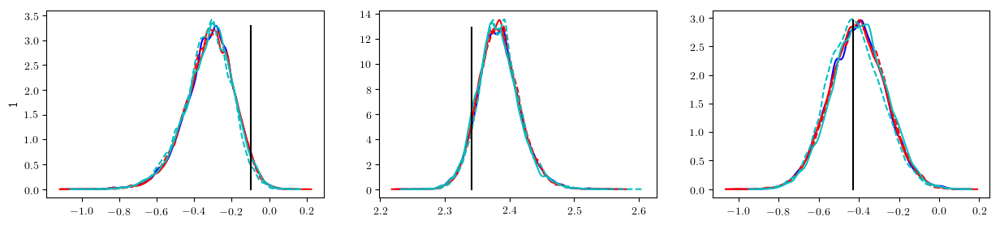

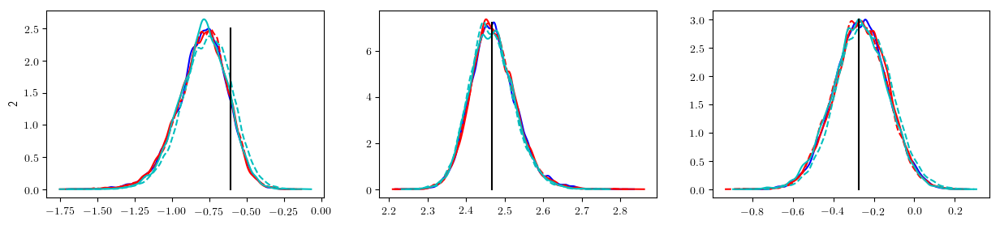

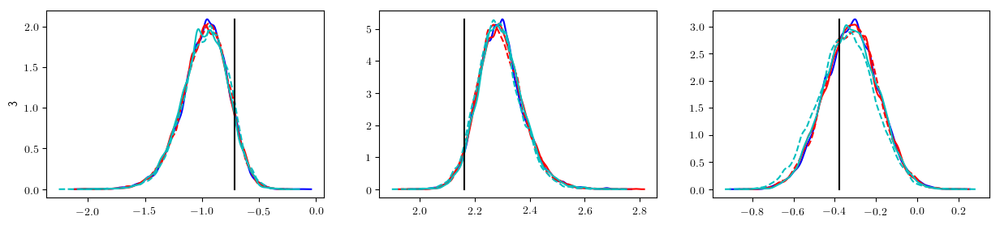

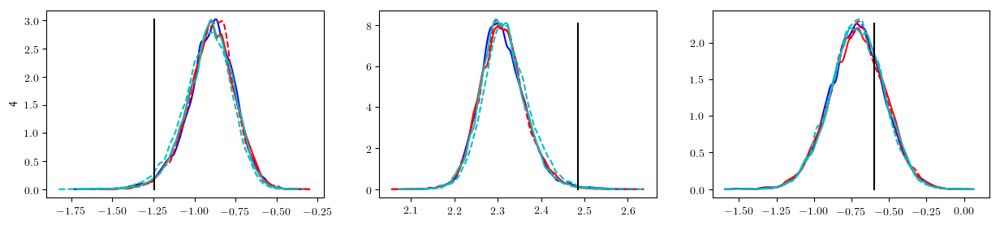

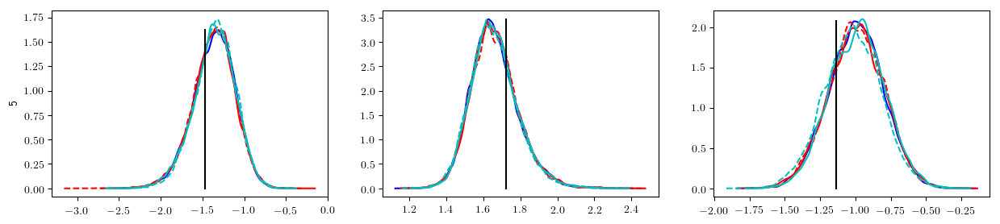

...

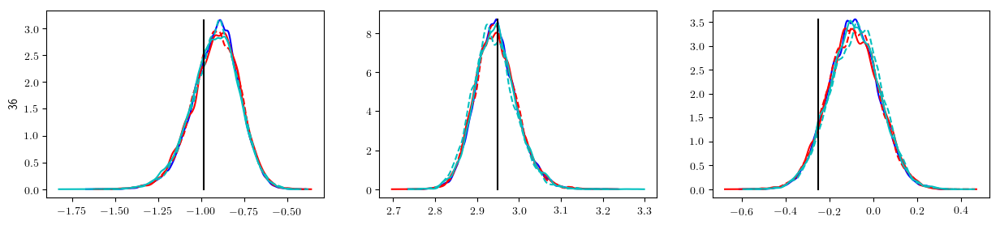

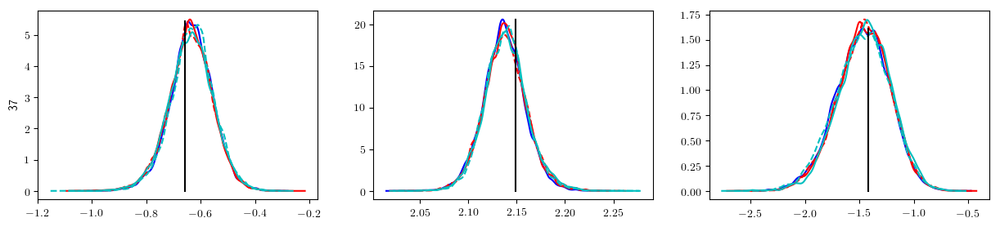

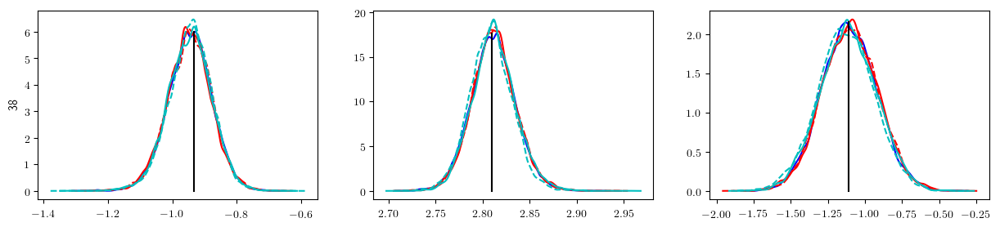

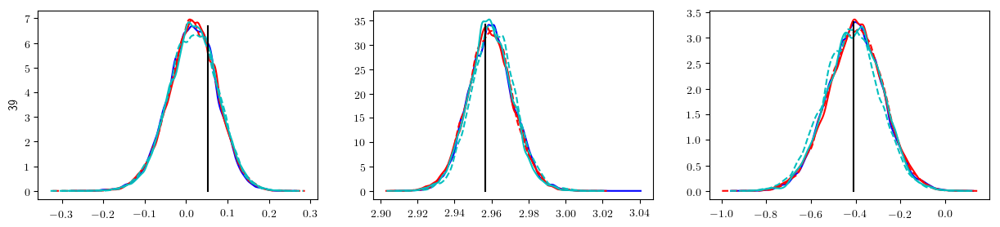

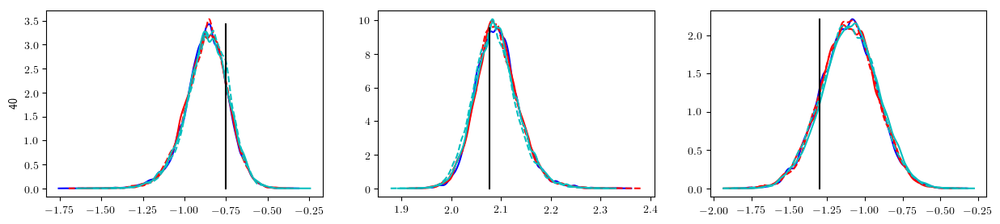

In [50]:
for m in 1:M_subjects
    
    posterior_kalman1 = kde(chain_ϕ_kalman[m,1,burn_in:end])
    posterior_pmmh1 = kde(chain_ϕ_pmmh[m,1,burn_in:end])
    posterior_pmmh_naive1 = kde(chain_ϕ_pmmh_naive[m,1,burn_in:end])
    posterior_cpmmh1099 = kde(chain_ϕ_cpmmh099[m,1,burn_in:end])
    posterior_cpmmh10999 = kde(chain_ϕ_cpmmh0999[m,1,burn_in:end])

    posterior_kalman2 = kde(chain_ϕ_kalman[m,2,burn_in:end])
    posterior_pmmh2 = kde(chain_ϕ_pmmh[m,2,burn_in:end])
    posterior_pmmh_naive2 = kde(chain_ϕ_pmmh_naive[m,2,burn_in:end])
    posterior_cpmmh2099 = kde(chain_ϕ_cpmmh099[m,2,burn_in:end])
    posterior_cpmmh20999 = kde(chain_ϕ_cpmmh0999[m,2,burn_in:end])

    posterior_kalman3 = kde(chain_ϕ_kalman[m,3,burn_in:end])
    posterior_pmmh3 = kde(chain_ϕ_pmmh[m,3,burn_in:end])
    posterior_pmmh_naive3 = kde(chain_ϕ_pmmh_naive[m,3,burn_in:end])
    posterior_cpmmh3099 = kde(chain_ϕ_cpmmh099[m,3,burn_in:end])
    posterior_cpmmh30999 = kde(chain_ϕ_cpmmh0999[m,3,burn_in:end])

    
    PyPlot.figure(figsize=(15,3))

    
    ax1 = PyPlot.subplot(1,3,1)

    PyPlot.plot(posterior_kalman1.x,posterior_kalman1.density, "b")        
    PyPlot.plot(posterior_pmmh1.x,posterior_pmmh1.density, "r")
    PyPlot.plot(posterior_pmmh_naive1.x,posterior_pmmh_naive1.density, "--r")
    PyPlot.plot(posterior_cpmmh1099.x,posterior_cpmmh1099.density, "c")
    PyPlot.plot(posterior_cpmmh10999.x,posterior_cpmmh10999.density, "--c")
    PyPlot.plot((ϕ[m,1], ϕ[m,1]), (0, maximum(posterior_kalman1.density)), "k")
   #PyPlot.xlim((minimum([minimum(posterior_kalman1.x);
    #             minimum(posterior_pmmh1.x);
    #             minimum(posterior_cpmmh1099.x)])-0.2, maximum([maximum(posterior_kalman1.x);
    #                                                         maximum(posterior_pmmh1.x);
    #                                                         maximum(posterior_cpmmh1099.x)])+0.2));
    PyPlot.ylabel(m)
    
    ax1 = PyPlot.subplot(1,3,2)
    PyPlot.plot(posterior_kalman2.x,posterior_kalman2.density, "b")        
    PyPlot.plot(posterior_pmmh2.x,posterior_pmmh2.density, "r")
    PyPlot.plot(posterior_pmmh_naive2.x,posterior_pmmh_naive2.density, "--r")
    PyPlot.plot(posterior_cpmmh2099.x,posterior_cpmmh2099.density, "c")
    PyPlot.plot(posterior_cpmmh20999.x,posterior_cpmmh20999.density, "--c")
    PyPlot.plot((ϕ[m,2], ϕ[m,2]), (0, maximum(posterior_kalman2.density)), "k")
    #PyPlot.xlim((minimum([minimum(posterior_kalman2.x);
    #             minimum(posterior_pmmh2.x);
    #             minimum(posterior_cpmmh2099.x)])-0.2, maximum([maximum(posterior_kalman2.x);
    #                                                         maximum(posterior_pmmh2.x);
    #                                                         maximum(posterior_cpmmh2099.x)])+0.2));

    ax1 = PyPlot.subplot(1,3,3)
    PyPlot.plot(posterior_kalman3.x,posterior_kalman3.density, "b")        
    PyPlot.plot(posterior_pmmh3.x,posterior_pmmh3.density, "r")
    PyPlot.plot(posterior_pmmh_naive3.x,posterior_pmmh_naive3.density, "--r")
    PyPlot.plot(posterior_cpmmh3099.x,posterior_cpmmh3099.density, "c")
    PyPlot.plot(posterior_cpmmh30999.x,posterior_cpmmh30999.density, "--c")
    PyPlot.plot((ϕ[m,3], ϕ[m,3]), (0, maximum(posterior_kalman3.density)), "k")
    #PyPlot.xlim((minimum([minimum(posterior_kalman3.x);
    #             minimum(posterior_pmmh3.x);
    #             minimum(posterior_cpmmh3099.x)])-0.2, maximum([maximum(posterior_kalman3.x);
     #                                                        maximum(posterior_pmmh3.x);
     #                                                        maximum(posterior_cpmmh3099.x)])+0.2));

end 

In [51]:
nbr_particles1 = 100
nbr_particles2 = 50 # 50 or 100
ρ1 = 0.99
ρ2 = 0.999


nbr_particles_pmmh = 3000 
ρ_pmmh = 0.0

#job = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles)*"_"*string(ρ)

job_kalman = string(M_subjects)*"_"*string(N_time)
job_cpmmh099 = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles1)*"_"*string(ρ1)
job_cpmmh0999 = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles2)*"_"*string(ρ2)
job_pmmh_naive = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles_pmmh)*"_"*string(ρ_pmmh)
job_pmmh = string(M_subjects)*"_"*string(N_time)*"_"*string(nbr_particles_pmmh)*"_"*string(ρ_pmmh)

chain_σ_ϵ_kalman = zeros(1,R,length(seed))
chain_σ_ϵ_pmmh_naive = zeros(1,R,length(seed))
chain_σ_ϵ_pmmh = zeros(1,R,length(seed))
chain_σ_ϵ_cpmmh099 = zeros(1,R,length(seed))
chain_σ_ϵ_cpmmh0999 = zeros(1,R,length(seed))

chain_η_kalman = zeros(6,R,length(seed))
chain_η_pmmh_naive = zeros(6,R,length(seed))
chain_η_pmmh = zeros(6,R,length(seed))
chain_η_cpmmh099 = zeros(6,R,length(seed))
chain_η_cpmmh0999 = zeros(6,R,length(seed))


for i in 1:length(seed)
    chain_σ_ϵ_kalman_tmp = Matrix(CSV.read("data/SDEMEM OU/kalman/chain_sigma_epsilon_"*string(seed[i])*"_"*job_kalman*".csv",allowmissing=:auto))
    chain_σ_ϵ_kalman[:,:,i] = Matrix(chain_σ_ϵ_kalman_tmp')
    
    chain_σ_ϵ_pmmh_naive_tmp = Matrix(CSV.read("data/SDEMEM OU/naive_cpmmh/chain_sigma_epsilon_"*string(seed[i])*"_"*job_pmmh_naive*".csv",allowmissing=:auto))
    chain_σ_ϵ_pmmh_naive[:,:,i] = Matrix(chain_σ_ϵ_pmmh_naive_tmp')

    chain_σ_ϵ_pmmh_tmp = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_sigma_epsilon_"*string(seed[i])*"_"*job_pmmh*".csv",allowmissing=:auto))
    chain_σ_ϵ_pmmh[:,:,i] = Matrix(chain_σ_ϵ_pmmh_tmp')

    chain_σ_ϵ_cpmmh099_tmp = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_sigma_epsilon_"*string(seed[i])*"_"*job_cpmmh099*".csv",allowmissing=:auto))
    chain_σ_ϵ_cpmmh099[:,:,i] = Matrix(chain_σ_ϵ_cpmmh099_tmp')
    
    chain_σ_ϵ_cpmmh0999_tmp = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_sigma_epsilon_"*string(seed[i])*"_"*job_cpmmh0999*".csv",allowmissing=:auto))
    chain_σ_ϵ_cpmmh0999[:,:,i] = Matrix(chain_σ_ϵ_cpmmh0999_tmp')

    chain_η_kalman_tmp = Matrix(CSV.read("data/SDEMEM OU/kalman/chain_eta_"*string(seed[i])*"_"*job_kalman*".csv",allowmissing=:auto))
    chain_η_kalman[:,:,i] = Matrix(chain_η_kalman_tmp')
    
    chain_η_pmmh_tmp = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_eta_"*string(seed[i])*"_"*job_pmmh*".csv",allowmissing=:auto))
    chain_η_pmmh[:,:,i] = Matrix(chain_η_pmmh_tmp')

    chain_η_pmmh_naive_tmp = Matrix(CSV.read("data/SDEMEM OU/naive_cpmmh/chain_eta_"*string(seed[i])*"_"*job_pmmh_naive*".csv",allowmissing=:auto))
    chain_η_pmmh_naive[:,:,i] = Matrix(chain_η_pmmh_naive_tmp')

    chain_η_cpmmh099_tmp = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_eta_"*string(seed[i])*"_"*job_cpmmh099*".csv",allowmissing=:auto))
    chain_η_cpmmh099[:,:,i] = Matrix(chain_η_cpmmh099_tmp')

    chain_η_cpmmh0999_tmp = Matrix(CSV.read("data/SDEMEM OU/cpmmh/chain_eta_"*string(seed[i])*"_"*job_cpmmh0999*".csv",allowmissing=:auto))
    chain_η_cpmmh0999[:,:,i] = Matrix(chain_η_cpmmh0999_tmp')

end


┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a deprecated keyword argument
└ @ CSV /home/samuel/.julia/packages/CSV/76SRf/src/CSV.jl:330
┌ Warning: `allowmissing` is a d

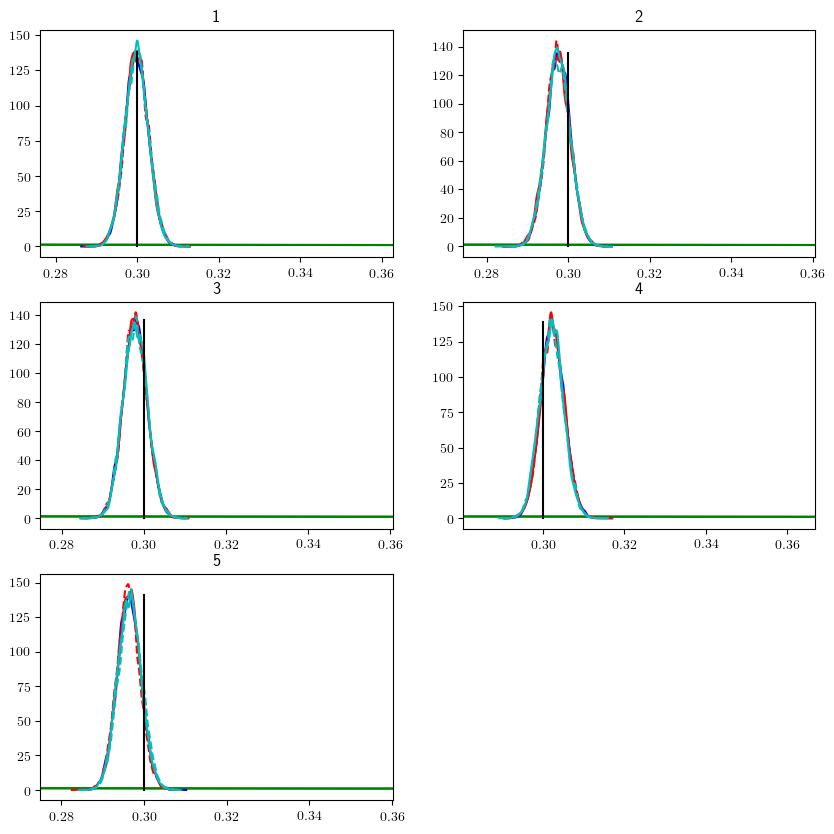

In [52]:
prior_grid = LinRange(0,1,100)
prior = pdf.(Gamma(prior_parameters_σ_ϵ[1],1/prior_parameters_σ_ϵ[2]),prior_grid)

PyPlot.figure(figsize=(10,10))

for i in 1:length(seed)

    PyPlot.subplot(3,2,i)
    PyPlot.plot(prior_grid,prior, "g")
    PyPlot.title(i)
    
    posterior_kalman = kde(chain_σ_ϵ_kalman[1,burn_in:end,i])
    posterior_pmmh_naive = kde(chain_σ_ϵ_pmmh_naive[1,burn_in:end,i])
    posterior_pmmh = kde(chain_σ_ϵ_pmmh[1,burn_in:end,i])
    posterior_cpmmh099 = kde(chain_σ_ϵ_cpmmh099[1,burn_in:end,i])
    posterior_cpmmh0999 = kde(chain_σ_ϵ_cpmmh0999[1,burn_in:end,i])

    PyPlot.plot(prior_grid,prior, "g")
    PyPlot.plot(posterior_kalman.x,posterior_kalman.density, "b", alpha = 1)    
    PyPlot.plot(posterior_pmmh.x,posterior_pmmh.density, "r")
    PyPlot.plot(posterior_pmmh_naive.x,posterior_pmmh_naive.density, "--r")
    PyPlot.plot(posterior_cpmmh099.x,posterior_cpmmh099.density, "c")
    PyPlot.plot(posterior_cpmmh0999.x,posterior_cpmmh0999.density, "--c")
    PyPlot.plot((σ_ϵ, σ_ϵ), (0, maximum(posterior_kalman.density)), "k")
    PyPlot.xlim((minimum(posterior_kalman.x)-0.01, maximum(posterior_kalman.x)+0.05));

end 


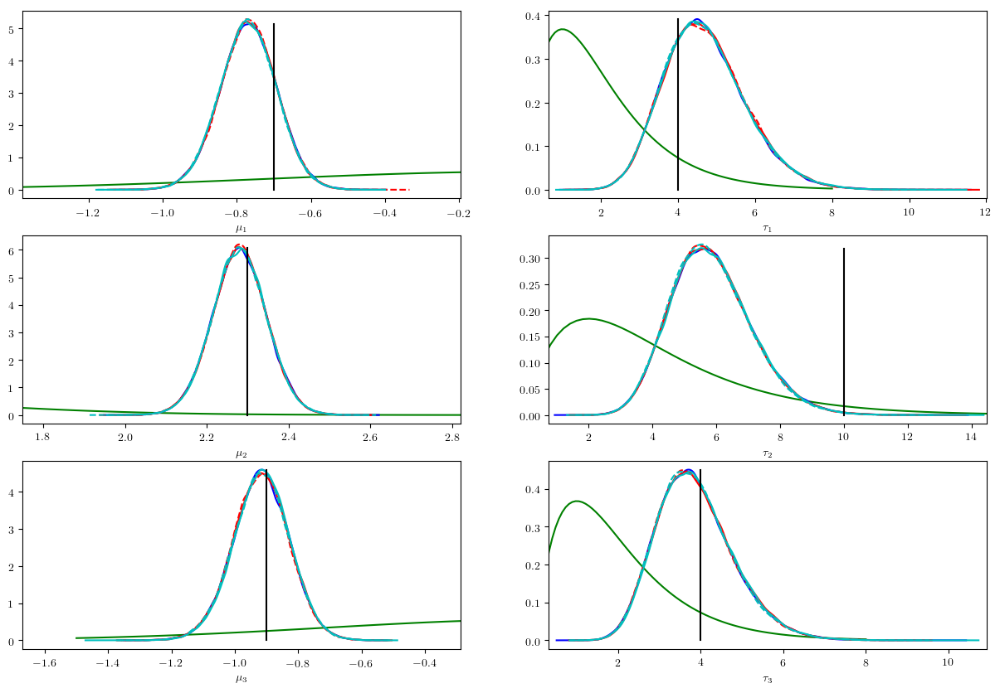

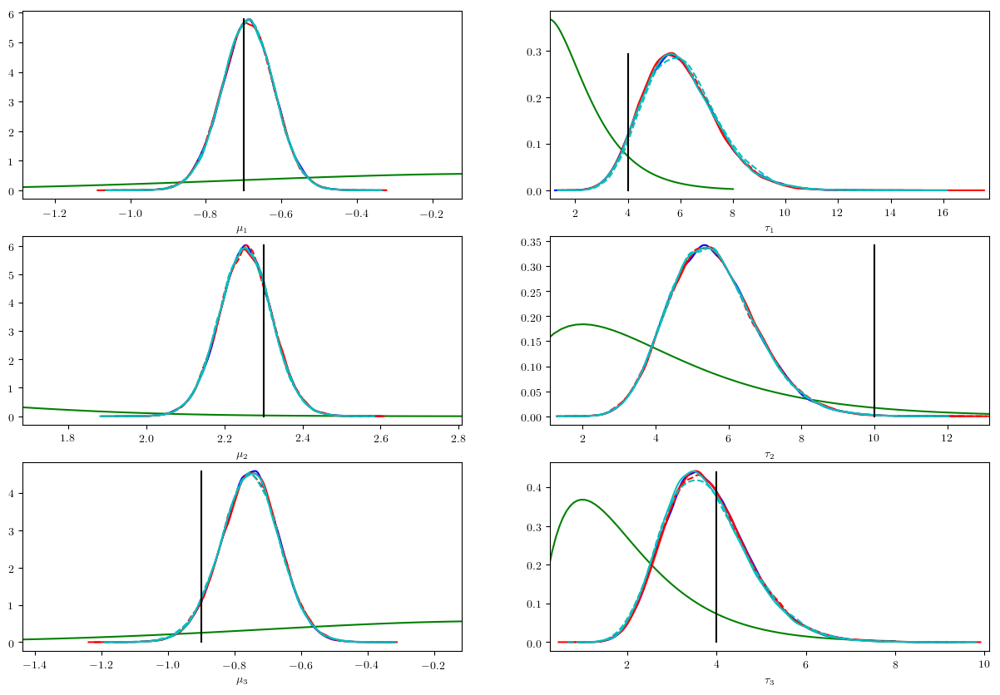

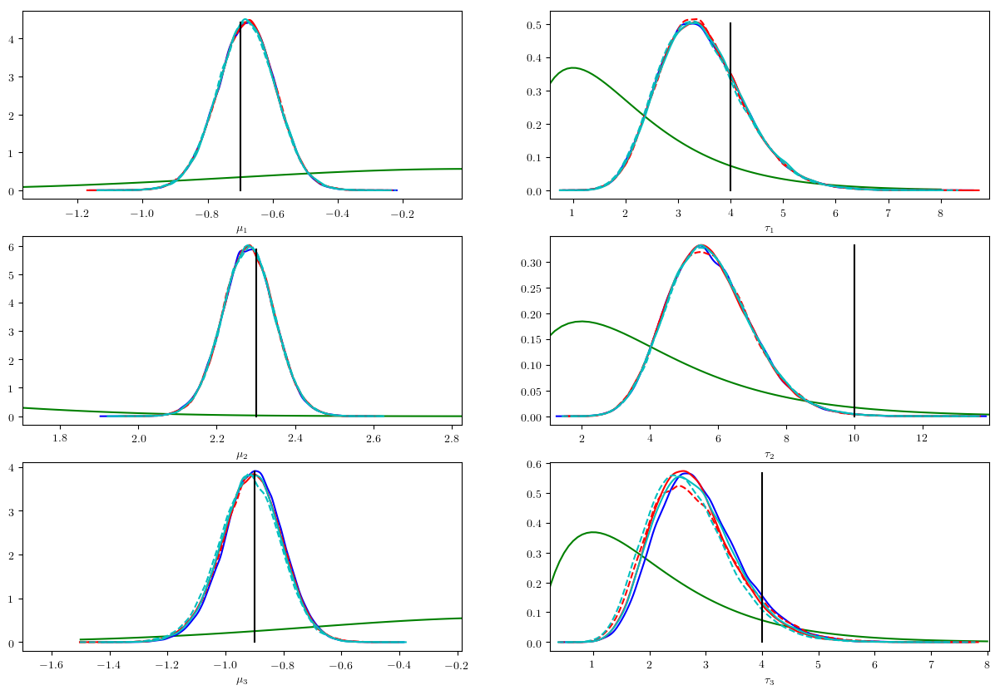

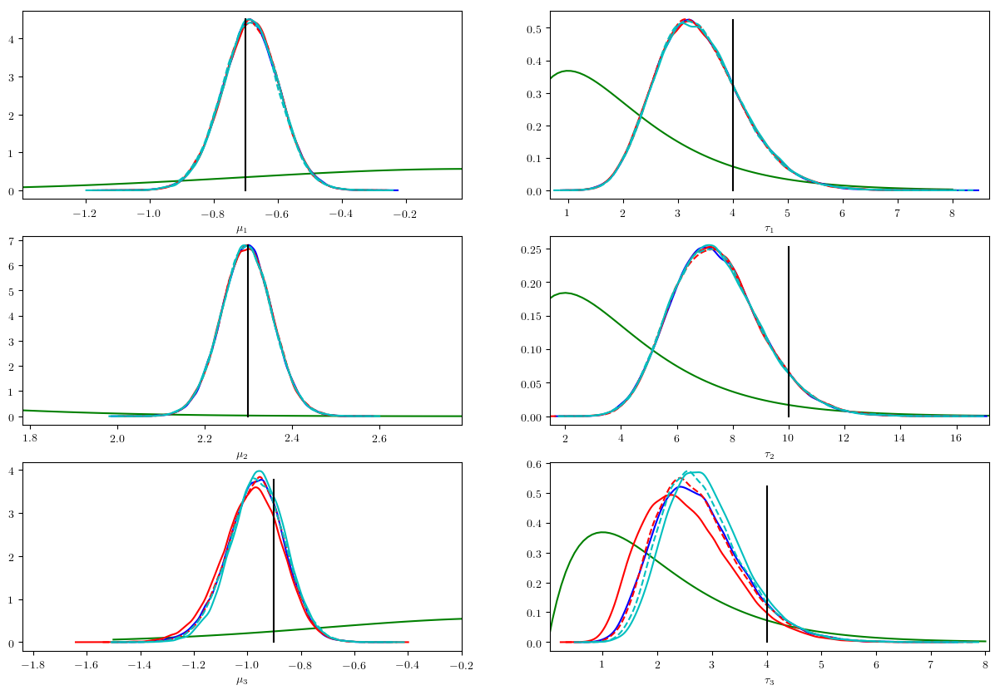

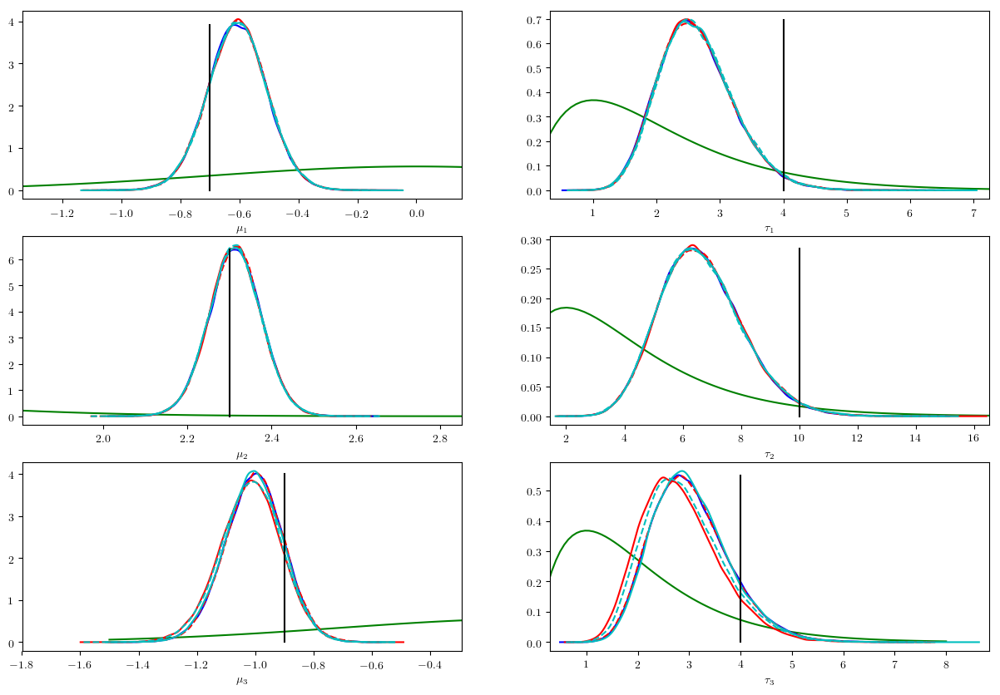

In [53]:
prior_grid_tau = LinRange(0,8,100)
prior_grid_tau2 = LinRange(0,20,100)

prior_tau1 = pdf.(Gamma(prior_parameters_η[1,3],1/prior_parameters_η[1,4]),prior_grid_tau)
prior_tau2 = pdf.(Gamma(prior_parameters_η[2,3],1/prior_parameters_η[2,4]),prior_grid_tau2)
prior_tau3 = pdf.(Gamma(prior_parameters_η[3,3],1/prior_parameters_η[3,4]),prior_grid_tau)

prior_grid_mu13 = prior_grid = LinRange(-1.5,1,100)
prior_grid_mu2 = prior_grid = LinRange(0,3,100)

tau1 = prior_parameters_η[1,3]/prior_parameters_η[1,4]
tau2 = prior_parameters_η[2,3]/prior_parameters_η[2,4]
tau3 = prior_parameters_η[3,3]/prior_parameters_η[3,4]

prior_mu1 = pdf.(Normal(prior_parameters_η[1,1],sqrt(1/(prior_parameters_η[1,2]*tau1))),prior_grid_mu13)
prior_mu2 = pdf.(Normal(prior_parameters_η[2,1],sqrt(1/(prior_parameters_η[2,2]*tau2))),prior_grid_mu2)
prior_mu3 = pdf.(Normal(prior_parameters_η[3,1],sqrt(1/(prior_parameters_η[3,2]*tau3))),prior_grid_mu13)

#PyPlot.figure(figsize=(15,10))

for i in 1:length(seed)
    

    PyPlot.figure(figsize=(15,10))
    
    posterior_kalman1 = kde(chain_η_kalman[1,burn_in:end,i])
    posterior_pmmh1 = kde(chain_η_pmmh[1,burn_in:end,i])
    posterior_pmmh_naive1 = kde(chain_η_pmmh_naive[1,burn_in:end,i])
    posterior_cpmmh1099 = kde(chain_η_cpmmh099[1,burn_in:end,i])
    posterior_cpmmh10999 = kde(chain_η_cpmmh0999[1,burn_in:end,i])

    posterior_kalman2 = kde(chain_η_kalman[2,burn_in:end,i])
    posterior_pmmh2 = kde(chain_η_pmmh[2,burn_in:end,i])
    posterior_pmmh_naive2 = kde(chain_η_pmmh_naive[2,burn_in:end,i])
    posterior_cpmmh2099 = kde(chain_η_cpmmh099[2,burn_in:end,i])
    posterior_cpmmh20999 = kde(chain_η_cpmmh0999[2,burn_in:end,i])

    posterior_kalman3 = kde(chain_η_kalman[3,burn_in:end,i])
    posterior_pmmh3 = kde(chain_η_pmmh[3,burn_in:end,i])
    posterior_pmmh_naive3 = kde(chain_η_pmmh_naive[3,burn_in:end,i])
    posterior_cpmmh3099 = kde(chain_η_cpmmh099[3,burn_in:end,i])
    posterior_cpmmh30999 = kde(chain_η_cpmmh0999[3,burn_in:end,i])

    posterior_kalman4 = kde(chain_η_kalman[4,burn_in:end,i])
    posterior_pmmh4 = kde(chain_η_pmmh[4,burn_in:end,i])
    posterior_pmmh_naive4 = kde(chain_η_pmmh_naive[4,burn_in:end,i])
    posterior_cpmmh4099 = kde(chain_η_cpmmh099[4,burn_in:end,i])
    posterior_cpmmh40999 = kde(chain_η_cpmmh0999[4,burn_in:end,i])

    posterior_kalman5 = kde(chain_η_kalman[5,burn_in:end,i])
    posterior_pmmh5 = kde(chain_η_pmmh[5,burn_in:end,i])
    posterior_pmmh_naive5 = kde(chain_η_pmmh_naive[5,burn_in:end,i])
    posterior_cpmmh5099 = kde(chain_η_cpmmh099[5,burn_in:end,i])
    posterior_cpmmh50999 = kde(chain_η_cpmmh0999[5,burn_in:end,i])

    posterior_kalman6 = kde(chain_η_kalman[6,burn_in:end,i])
    posterior_pmmh6 = kde(chain_η_pmmh[6,burn_in:end,i])
    posterior_pmmh_naive6 = kde(chain_η_pmmh_naive[6,burn_in:end,i])
    posterior_cpmmh6099 = kde(chain_η_cpmmh099[6,burn_in:end,i])
    posterior_cpmmh60999 = kde(chain_η_cpmmh0999[6,burn_in:end,i])


    PyPlot.figure(figsize=(15,10))

    ax1 = PyPlot.subplot(3,2,1)
    PyPlot.plot(prior_grid_mu13,prior_mu1, "g")
    PyPlot.plot(posterior_kalman1.x,posterior_kalman1.density, "b")        
    PyPlot.plot(posterior_pmmh1.x,posterior_pmmh1.density, "r")
    PyPlot.plot(posterior_pmmh_naive1.x,posterior_pmmh_naive1.density, "--r")
    PyPlot.plot(posterior_cpmmh1099.x,posterior_cpmmh1099.density, "c")
    PyPlot.plot(posterior_cpmmh10999.x,posterior_cpmmh10999.density, "--c")
    PyPlot.plot((η[1], η[1]), (0, maximum(posterior_kalman1.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman1.x);
                 minimum(posterior_pmmh1.x);
                 minimum(posterior_cpmmh1099.x)])-0.2, maximum([maximum(posterior_kalman1.x);
                                                             maximum(posterior_pmmh1.x);
                                                             maximum(posterior_cpmmh1099.x)])+0.2));
    

    PyPlot.xlabel(L"\mu_1")



    ax1 = PyPlot.subplot(3,2,3)
    PyPlot.plot(prior_grid_mu2,prior_mu2, "g")
    PyPlot.plot(posterior_kalman2.x,posterior_kalman2.density, "b")        
    PyPlot.plot(posterior_pmmh2.x,posterior_pmmh2.density, "r")
    PyPlot.plot(posterior_pmmh_naive2.x,posterior_pmmh_naive2.density, "--r")
    PyPlot.plot(posterior_cpmmh2099.x,posterior_cpmmh2099.density, "c")
    PyPlot.plot(posterior_cpmmh20999.x,posterior_cpmmh20999.density, "--c")
    PyPlot.plot((η[2], η[2]), (0, maximum(posterior_kalman2.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman2.x);
                 minimum(posterior_pmmh2.x);
                 minimum(posterior_cpmmh2099.x)])-0.2, maximum([maximum(posterior_kalman2.x);
                                                             maximum(posterior_pmmh2.x);
                                                             maximum(posterior_cpmmh2099.x)])+0.2));

    PyPlot.xlabel(L"\mu_2")



    ax1 = PyPlot.subplot(3,2,5)
    PyPlot.plot(prior_grid_mu13,prior_mu3, "g")
    PyPlot.plot(posterior_kalman3.x,posterior_kalman3.density, "b")        
    PyPlot.plot(posterior_pmmh3.x,posterior_pmmh3.density, "r")
    PyPlot.plot(posterior_pmmh_naive3.x,posterior_pmmh_naive3.density, "--r")
    PyPlot.plot(posterior_cpmmh3099.x,posterior_cpmmh3099.density, "c")
    PyPlot.plot(posterior_cpmmh30999.x,posterior_cpmmh30999.density, "--c")
    PyPlot.plot((η[3], η[3]), (0, maximum(posterior_kalman3.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman3.x);
                 minimum(posterior_pmmh3.x);
                 minimum(posterior_cpmmh3099.x)])-0.2, maximum([maximum(posterior_kalman3.x);
                                                             maximum(posterior_pmmh3.x);
                                                             maximum(posterior_cpmmh3099.x)])+0.2));

    PyPlot.xlabel(L"\mu_3")


    ax1 = PyPlot.subplot(3,2,2)
    PyPlot.plot(prior_grid_tau,prior_tau1, "g")
    PyPlot.plot(posterior_kalman4.x,posterior_kalman4.density, "b")        
    PyPlot.plot(posterior_pmmh4.x,posterior_pmmh4.density, "r")
    PyPlot.plot(posterior_pmmh_naive4.x,posterior_pmmh_naive4.density, "--r")
    PyPlot.plot(posterior_cpmmh4099.x,posterior_cpmmh4099.density, "c")
    PyPlot.plot(posterior_cpmmh40999.x,posterior_cpmmh40999.density, "--c")
    PyPlot.plot((η[4], η[4]), (0, maximum(posterior_kalman4.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman4.x);
                 minimum(posterior_pmmh4.x);
                 minimum(posterior_cpmmh4099.x)])-0.2, maximum([maximum(posterior_kalman4.x);
                                                             maximum(posterior_pmmh4.x);
                                                             maximum(posterior_cpmmh4099.x)])+0.2));
    PyPlot.xlabel(L"\tau_1")


    ax1 = PyPlot.subplot(3,2,4)
    PyPlot.plot(prior_grid_tau2,prior_tau2, "g")
    PyPlot.plot(posterior_kalman5.x,posterior_kalman5.density, "b")        
    PyPlot.plot(posterior_pmmh5.x,posterior_pmmh5.density, "r")
    PyPlot.plot(posterior_pmmh_naive5.x,posterior_pmmh_naive5.density, "--r")
    PyPlot.plot(posterior_cpmmh5099.x,posterior_cpmmh5099.density, "c")
    PyPlot.plot(posterior_cpmmh50999.x,posterior_cpmmh50999.density, "--c")
    PyPlot.plot((η[5], η[5]), (0, maximum(posterior_kalman5.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman5.x);
                 minimum(posterior_pmmh5.x);
                 minimum(posterior_cpmmh5099.x)])-0.2, maximum([maximum(posterior_kalman5.x);
                                                             maximum(posterior_pmmh5.x);
                                                             maximum(posterior_cpmmh5099.x)])+0.1));

    PyPlot.xlabel(L"\tau_2")


    ax1 = PyPlot.subplot(3,2,6)
    PyPlot.plot(prior_grid_tau,prior_tau3, "g")
    PyPlot.plot(posterior_kalman6.x,posterior_kalman6.density, "b")        
    PyPlot.plot(posterior_pmmh6.x,posterior_pmmh6.density, "r")
    PyPlot.plot(posterior_pmmh_naive6.x,posterior_pmmh_naive6.density, "--r")
    PyPlot.plot(posterior_cpmmh6099.x,posterior_cpmmh6099.density, "c")
    PyPlot.plot(posterior_cpmmh60999.x,posterior_cpmmh60999.density, "--c")
    PyPlot.plot((η[6], η[6]), (0, maximum(posterior_kalman6.density)), "k")
    PyPlot.xlim((minimum([minimum(posterior_kalman6.x);
                 minimum(posterior_pmmh6.x);
                 minimum(posterior_cpmmh6099.x)])-0.2, maximum([maximum(posterior_kalman6.x);
                                                             maximum(posterior_pmmh6.x);
                                                             maximum(posterior_cpmmh6099.x)])+0.2))
    PyPlot.xlabel(L"\tau_3");

    
end


Speed-up results for this data:

print(round(apply(res,c(2,3),mean),2))
       [,1]   [,2]   [,3]    [,4]
[1,]   0.24 100.87 415.60 3352.50
[2,] 765.42  94.91   0.12    1.00
[3,] 681.99 101.47   0.15    1.20
[4,]  34.70  97.34   2.81   22.65
[5,]  18.96  96.23   5.08   40.99